<a id='BacktoTop'></a>

## Lab 3: Online News Popularity Dataset Clustering Models

## MSDS 7331: Data Mining
## Dr. Drew
## Group 3: Shanqing Gu, Manisha Pednekar, Dmitry Andreev and Jonathan Knowles



### Table of Contents 

#### Section 1 - Business Understanding
 * [1 - Business Understanding 1](#BusinessUnderstanding1) 
   * 1.1 Describe the purpose of the data set you selected
   * 1.2 How will you measure the effectiveness of a good algorithm?
   * 1.3 Why does your chosen validation method make sense for this specific dataset and the stakeholders needs?
 
#### Section 2 - Data Understanding
 * [2.1 - Data Understanding 1](#DataUnderstanding1)
   * 2.1.1. Describe the meaning and type of data (scale, values, etc.) for each attribute in the data file.
   * 2.1.2. Verify data quality: Are there missing values? Duplicate data? Outliers? Are those mistakes?
   * 2.1.3. How do you deal with these problems? 
 * [2.2 - Data Understanding 2](#DataUnderstanding2)
   * 2.2.1 - Get dataframe size, shape, and info()
   * 2.2.2 - Check for Normal Distribution & Skewness of the 36 variables
   * 2.2.3 - Important attribute - Title Sentiment Polarity
   * 2.2.4 - Important attribute - LDA
   * 2.2.5 - Important attribute - Day of the week
   * 2.2.6 - Important attribute - Data Channel
   * 2.2.7 - Important attribute - Digital Media
   * 2.2.8 - Important attribute - Natural Language Processing
   * 2.2.9 - Important attribute - Number of Words
 
#### Section 3 - Model and Evaluation
 * [3.1 - Model and Evaluation 1 - Train and Adjust parameters](#ModelandEvaluation1)
   * [3.1.1 - dimensionality reduction](#DmensionalityReduction)
   * [3.1.2 - Train and adjust clustering algorithm](#TrainAdjustCA)
   * [3.1.3 - Evaluation](#Evaluation)
   * [3.1.4 - Visualization and summarization](#VisualizationSummarization)
 * [3.2 - Model and Evaluation 2 - Evaluate and Compare](#ModelandEvaluation2)
   * [3.2.1 - Dimensionality reduction with PCA or t-SNE](#DimensionalityReduction)
   * [3.2.2 - K-Means clustering via PCA or t-SNE](#KMeansClustering)
     * [3.2.2.1 - K-Means clustering via PCA](#PCADR)
     * [3.2.2.2 - K-Means clustering via t-SNE](#tSNEDR)
   * [3.2.3 - Spectral clustering via t-SNE](#SpectralClustering)
   * [3.2.4 - Hierarchical clustering via t-SNE](#HierarchicalClustering)   
     * [3.2.4.1 - Complete linkage](#HCCompleteLinkage) 
     * [3.2.4.2 - Average linkage](#HCAverageLinkage)
     * [3.2.4.3 - Ward linkage](#HCAverageLinkage)
     * [3.2.4.4 - Hierarchical Model Summary](#HCModelSummary)
     
 * [3.3 - Model and Evaluation 3 - Visualize Results](#ModelandEvaluation3)
   * 3.3.1 - Join the feature dataset to the cluster identification regions from the k-means analysis 
   * 3.3.2 - Summary table for relative difference of each feature within each cluster
   * 3.3.3 - Plots across clusters for each feature: feature distribution, feature boxplots, cluster color map
   * 3.3.4 - Boxplot for cluster in feature participation
   * 3.3.5 - Plot for cluster with sorted relative feature participation
   * 3.3.6 - Check each cluster with sorted relative feature participation
 
 * [3.4 - Model and Evaluation 4 - Summarize the Ramifications](#ModelandEvaluation4)
   * 3.4.1 - K-Means clustering summary
     * 3.4.1.1 LDA
     * 3.4.1.2 Day of the week
     * 3.4.1.3 Data Channel
     * 3.4.1.4 Digital Media
     * 3.4.1.5. Number of keywords
   * 3.4.2 - Summary of other clustering models ( Spectral clustering and hierarchical clustering)
   * 3.4.3 - Limitations for three clustering models
   * 3.4.4 - Future improvement
 
#### Section 4 - Development
 * [4 - Development](#Development)
   *  4.1 - Be critical and tell how your current model might be usable by other parties.
   *  4.2 - Did you achieve your goals? If not, can you reign in the utility of your modeling?
   *  4.3 - How useful is your model for interested parties?
   *  4.4 - How would you deploy your model for interested parties?
   *  4.5 - What other data should be collected?
   *  4.6 - How often would the model need to be updated, etc.? 
 
#### Section 5 - Exceptional Work
 * [5.1 - Implement two dimensionality reduction techniques: t-SNE and PCA](#ExceptionalWork51)
 * [5.2 - Combine t-SNE and PCA for dimensionality reduction](#ExceptionalWork52)
   * 5.2.1 - Get the minimum features to explain 90% of the variance in PCA
   * 5.2.2 - Continue with t-SNE and K-Means clustering after PCA ( n_components=20 )
   * 5.2.3 - Continue with K-Means clustering after PCA and t-SNE dimensionality reduction
 
#### References
 * [References](#references)

<a id='BusinessUnderstanding1'></a>
### Section 1 -  Business Understanding 1 (10 points)
[Back to top](#BacktoTop)

#### Section Objective:
Describe the purpose of the data set you selected (i.e., why was this data collected in the first place?). How will you measure the effectiveness of a good algorithm? Why does your chosen validation method make sense for this specific dataset and the stakeholders needs?

    
#### 1.1 Describe the purpose of the data set you selected (i.e., why was this data collected in the first place?).

This Online News Popularity Dataset was from [Mashable](https://mashable.com), a popular news and opinion website that focuses on social media and technology. The dataset is available for download at the [UCI Machine Learning Repository](https://archive.ics.uci.edu/ml/datasets/Online+News+Popularity)

The data consists of 39,644 records with 61 attributes that provide details and meta-data about online news articles that were published by Mashable over a two-year period ranging 2013 - 2015. Popularity is defined as the number of times that the article is shared across all social media platforms. This data is important because it can be used to help Mashable and other online publishers understand the factors that play a part in how popular their articles are.  

The goal of collecting this data was to perform cluster analysis on this dataset in order to implement a good clustering method which will produce high quality clusters with high / low intra-class similarity and discover some or all of the hidden patterns. 

    
#### 1.2 How will you measure the effectiveness of a good algorithm?

Clustering is a standard procedure in multivariate data analysis. With the data objects and their features specified, our team will evaluate the different performances in varied clustering models (K-Means, spectral, and hierarchical clustering).

For each model, we need to optimize parameter settings for appropriate clustering algorithm with the silhouette value as a means for clustering evaluation. With this method, each cluster is represented by a silhouette displaying which objects lie well within the cluster and which objects are marginal to the cluster. The evaluation of data processing time will be recorded and guide the future deployment.

Our group would like to create clustering models that can help understand how an article will be popular in certain circumstances. The comparative cluster analysis with different methods provide the helpful views of the cluster characteristics.

The robustness and validity for the tested clustering methods will be compared with tables, plots, and spectral maps. This comparative analysis will be helpful to address if there is merit in further developing this cluster analysis concept. If unique characteristics are identifiable across the clusters and these characteristics are manageable by the newspaper owners for future modification, the clustering will be considered successful.
    
#### 1.3 Why does your chosen validation method make sense for this specific dataset and the stakeholders needs?

Evaluation (or "validation") of clustering with selected parameters for each method will be based on the popular approaches, involving "internal" evaluation (where the clustering is summarized to a single quality score) and "external" evaluation(where the clustering is compared to an existing "ground truth" classification).

In this project, we use silhouette coefficient as internal validation measures to describe and compare the clustering methods and the clusters. The Silhouette Coefficient is calculated using the mean intra-cluster distance (a) and the mean nearest-cluster distance (b) for each sample.

In the future, we also need to consider using external criteria for clustering quality control (purity, F-measure, Rand Index, average entropy).

[Back to top](#BacktoTop)

<a id='DataUnderstanding1'></a>
### Section 2.1 -  Data Understanding 1 (10 points)

[Back to top](#BacktoTop)

Describe the meaning and type of data (scale, values, etc.) for each attribute in the data file. Verify data quality: Are there missing values? Duplicate data? Outliers? Are those mistakes? How do you deal with these problems?

#### This section includes:

    2.1.1 - Describe the meaning and type of data (scale, values, etc.) for each attribute in the data file
    2.1.2 - Verify data quality: Are there missing values? Duplicate data? Outliers? Are those mistakes?
    2.1.3 - How do you deal with these problems?

#### 2.1.1. Describe the meaning and type of data (scale, values, etc.) for each attribute in the data file. 

##### 2.1.1.1. Import Required Packages

To keep this Jupyter notebook organized, we decided to import the necessary Python libraries and modules all together at the beginning rather than doing so separately as we move through each section. The following libraries will be used for this lab assignment:

* pandas for data manipulation
* numpy for multidimensional array computing
* matplotlib.pyplot and Seaborn for data visualization
* %matplotlib inline to include plots within the notebook
* sns.set_style to apply the same theme for plots throughtout notebook
* IPython.display to embed rendered HTML output in iPython (Jupyter Notebook)
* sklearn.model_selection to split data set into train and test subsets and for cross validation
* sklearn.preprocessing for standardizing and scaling data set prior to use in predictive model
* sklearn.ensemble to make use of the random forest classifier model
* sklearn.calibration to calibrate our classification models
* sklearn.svm to make use of the support vector machines classifier model
* sklearn.linear_model to make use of the logistic regression classifier model
* sklearn.metrics to use loss, accuracy, utility functions to measure classification performance

In [1]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd 
import numpy as np 

import matplotlib.pyplot as plt 
%matplotlib inline 

import seaborn as sns

from IPython.display import display, HTML

from sklearn import metrics as mt

from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score as acc
from sklearn.metrics import confusion_matrix as conf
from sklearn.metrics import f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import precision_recall_fscore_support as score

import copy

from time import time
from datetime import datetime
from time import strftime


from pylab import rcParams

from sklearn.model_selection import ShuffleSplit
from sklearn.preprocessing import StandardScaler

from sklearn.cluster import KMeans

from tabulate import tabulate

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from __future__ import print_function
print(__doc__)

Automatically created module for IPython interactive environment


##### 2.1.1.2. Import data set from .csv file and remove non-predictive attributes

In this section we are simply importing in the **Online News Popularity Data Set** from the csv file that we had downloaded from the [UCI Machine Learning Repository](https://archive.ics.uci.edu/ml/datasets/Online+News+Popularity). The data set is being read in as a pandas dataframe so we can easily proceed with any data cleaning and processing methods required prior to using it in our clustering analysis.

In [2]:
# read csv file
df = pd.read_csv("OnlineNewsPopularity.csv")

In [3]:
# variable description

variables_index = [
[' n_tokens_title', 'ratio', 'TBD', 'Number of words in the title']
,[' n_tokens_content', 'ratio', 'TBD', 'Number of words in the content 0-8500 ']
,[' n_unique_tokens', 'ratio', 'TBD', 'Rate of unique words in the content']
,[' n_non_stop_words', 'ratio', 'TBD', 'Rate of non-stop words in the content']
,[' n_non_stop_unique_tokens', 'ratio', 'TBD', 'Rate of unique non-stop words in the content']
,[' num_hrefs', 'ratio', 'TBD', 'Number of links']
,[' num_self_hrefs', 'ratio', 'TBD', 'Number of links to other articles published by Mashable']
,[' num_imgs', 'ratio', 'TBD', 'Number of images']
,[' num_videos', 'ratio', 'TBD', 'Number of videos']
,[' average_token_length', 'ratio', 'TBD', '(Binary) Average length of the words in the content']
,[' num_keywords', 'ratio', 'TBD', '(Binary) Number of keywords in the metadata']
,[' data_channel_is_lifestyle', 'nominal', 'TBD', '(Binary) Is data channel Lifestyle?']
,[' data_channel_is_entertainment', 'nominal', 'TBD', '(Binary) Is data channel Entertainment?']
,[' data_channel_is_bus', 'nominal', 'TBD', '(Binary) Is data channel Business?']
,[' data_channel_is_socmed', 'nominal', 'TBD', '(Binary) Is data channel Social Media? ']
,[' data_channel_is_tech', 'nominal', 'TBD', '(Binary) Is data channel Tech?']
,[' data_channel_is_world', 'nominal', 'TBD', '(Binary) Is data channel World?']
,[' kw_min_min', 'ratio', 'TBD', 'Worst keyword (min. shares)']
,[' kw_max_min', 'ratio', 'TBD', 'Worst keyword (max. shares)']
,[' kw_avg_min', 'ratio', 'TBD', 'Worst keyword (avg. shares)']
,[' kw_min_max', 'ratio', 'TBD', 'Best keyword (min. shares)']
,[' kw_max_max', 'ratio', 'TBD', 'Best keyword (max. shares)']
,[' kw_avg_max', 'ratio', 'TBD', 'Best keyword (avg. shares)']
,[' kw_min_avg', 'ratio', 'TBD', 'Avg. keyword (min. shares)']
,[' kw_max_avg', 'ratio', 'TBD', 'Avg. keyword (max. shares)']
,[' kw_avg_avg', 'ratio', 'TBD', 'Avg. keyword (avg. shares)']
,[' self_reference_min_shares', 'ratio', 'TBD', 'Min. shares of referenced articles in Mashable']
,[' self_reference_max_shares', 'ratio', 'TBD', 'Max. shares of referenced articles in Mashable']
,[' self_reference_avg_sharess', 'ratio', 'TBD', 'Error or the Zillow model response variable']
,[' weekday_is_monday', 'nominal', 'TBD', '(Binary) Was the article published on a Monday? ']
,[' weekday_is_tuesday', 'nominal', 'TBD', '(Binary) Was the article published on a Tuesday? ']
,[' weekday_is_wednesday', 'nominal', 'TBD', '(Binary) Was the article published on a Wednesday?']
,[' weekday_is_thursday', 'nominal', 'TBD', '(Binary) Was the article published on a Thursday?']
,[' weekday_is_friday', 'nominal', 'TBD', '(Binary) Was the article published on a Friday? ']
,[' weekday_is_saturday', 'nominal', 'TBD', '(Binary) Was the article published on a Saturday? ']
,[' weekday_is_sunday', 'nominal', 'TBD', '(Binary) Was the article published on a Sunday? ']
,[' is_weekend', 'nominal', 'TBD', '(Binary) Was the article published on the weekend?']
,[' LDA_00', 'ratio', 'TBD', 'Closeness to LDA topic 0']
,[' LDA_01', 'ratio', 'TBD', 'Closeness to LDA topic 1']
,[' LDA_02', 'ratio', 'TBD', 'Closeness to LDA topic 2']
,[' LDA_03', 'ratio', 'TBD', 'Closeness to LDA topic 3']
,[' LDA_04', 'ratio', 'TBD', 'Closeness to LDA topic 4 ']
,[' global_subjectivity', 'ratio', 'TBD', 'Text subjectivity']
,[' global_sentiment_polarity', 'ratio', 'TBD', 'Text sentiment polarity ']
,[' global_rate_positive_words', 'ratio', 'TBD', 'Rate of positive words in the content ']
,[' global_rate_negative_words', 'ratio', 'TBD', 'Rate of negative words in the content ']
,[' rate_positive_words', 'ratio', 'TBD', 'Rate of positive words among non-neutral tokens']
,[' rate_negative_words', 'ratio', 'TBD', 'Rate of negative words among non-neutral tokens']
,[' avg_positive_polarity', 'ratio', 'TBD', 'Avg. polarity of positive words ']
,[' min_positive_polarity', 'ratio', 'TBD', 'Min. polarity of positive words ']
,[' max_positive_polarity', 'ratio', 'TBD', 'Max. polarity of positive words ']
,[' avg_negative_polarity', 'ratio', 'TBD', 'Avg. polarity of negative words']
,[' min_negative_polarity', 'ratio', 'TBD', 'Min. polarity of negative words']
,[' max_negative_polarity', 'ratio', 'TBD', 'Max. polarity of negative words']
,[' title_subjectivity', 'ratio', 'TBD', 'Title subjectivity']    
,[' title_sentiment_polarity', 'ratio', 'TBD', 'Title polarity']
,[' abs_title_subjectivity', 'ratio', 'TBD', 'Absolute subjectivity level']
,[' abs_title_sentiment_polarity', 'ratio', 'TBD', 'Absolute polarity level']
,[' shares', 'ratio', 'TBD', 'Number of shares (target)']
]

df.reindex(variables_index, fill_value=0)

variables = pd.DataFrame(variables_index, columns=['name', 'type', 'scale','description'])
variables = variables.set_index('name')

def output_variables_table(variables): #variables = variables.sort_index()
    rows = ['<tr><th>Variable</th><th>Type</th><th>Scale</th><th>Description</th></tr>']
    for vname, atts in variables.iterrows():
        atts = atts.to_dict()
        # add scale if TBD
        if atts['scale'] == 'TBD':
            if atts['type'] in ['nominal', 'ordinal']:
                uniques = df[vname].unique()
                uniques = list(uniques.astype(str))
                if len(uniques) < 10:
                    atts['scale'] = '[%s]' % ', '.join(uniques)
                else:
                    atts['scale'] = '[%s]' % (', '.join(uniques[:5]) + ', ... (%d More)' % len(uniques))
            if atts['type'] in ['ratio', 'interval']:
                atts['scale'] = '(%d, %d, %d, %d)' % (df[vname].min(), df[vname].mean(), df[vname].median(), df[vname].max())
        row = (vname, atts['type'], atts['scale'], atts['description'])
        rows.append('<tr><td>%s</td><td>%s</td><td>%s</td><td>%s</td></tr>' % row)
    return HTML('<table>%s</table>' % ''.join(rows))

output_variables_table(variables)

,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,url,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_socmed,data_channel_is_tech,data_channel_is_world,kw_min_min,kw_max_min,kw_avg_min,kw_min_max,kw_max_max,kw_avg_max,kw_min_avg,kw_max_avg,kw_avg_avg,self_reference_min_shares,self_reference_max_shares,self_reference_avg_sharess,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,weekday_is_friday,weekday_is_saturday,weekday_is_sunday,is_weekend,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,rate_positive_words,rate_negative_words,avg_positive_polarity,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,nominal,nominal,nominal,nominal,nominal,nominal,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,nominal,nominal,nominal,nominal,nominal,nominal,nominal,nominal,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,ratio,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,TBD,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
Number of words in the title,Number of words in the content 0-8500,Rate of unique words in the content,Rate of non-stop words in the content,Rate of unique non-stop words in the content,Number of links,Number of links to other articles published by Mashable,Number of images,Number of videos,(Binary) Average length of the words in the content,(Binary) Number of keywords in the metadata,(Binary) Is data channel Lifestyle?,(Binary) Is data channel Entertainment?,(Binary) Is data channel Business?,(Binary) Is data channel Social Media?,(Binary) Is data channel Tech?,(Binary) Is data channel World?,Worst keyword (min. shares),Worst keyword (max. shares),Worst keyword (avg. shares),Best keyword (min. shares),Best keyword (max. shares),Best keyword (avg. shares),Avg. keyword (min. shares),Avg. keyword (max. shares),Avg. keyword (avg. shares),Min. shares of referenced articles in Mashable,Max. shares of referenced articles in Mashable,Error or the Zillow model response variable,(Binary) Was the article published on a Monday?,(Binary) Was the article published on a Tuesday?,(Binary) Was the article published on a Wednesday?,(Binary) Was the article published on a Thursday?,(Binary) Was the article published on a Friday?,(Binary) Was the article published on a Saturday?,(Binary) Was the article published on a Sunday?,(Binary) Was the article published on the weekend?,Closeness to LDA topic 0,Closeness to LDA topic 1,Closeness to LDA topic 2,Closeness to LDA topic 3,Closeness to LDA topic 4,Text subjectivity,Text sentiment polarity,Rate of positive words in the content,Rate of negative words in the content,Rate of positive words among non-neutral tokens,Rate of negat

Variable,Type,Scale,Description
n_tokens_title,ratio,"(2, 10, 10, 23)",Number of words in the title
n_tokens_content,ratio,"(0, 546, 409, 8474)",Number of words in the content 0-8500
n_unique_tokens,ratio,"(0, 0, 0, 701)",Rate of unique words in the content
n_non_stop_words,ratio,"(0, 0, 0, 1042)",Rate of non-stop words in the content
n_non_stop_unique_tokens,ratio,"(0, 0, 0, 650)",Rate of unique non-stop words in the content
num_hrefs,ratio,"(0, 10, 8, 304)",Number of links
num_self_hrefs,ratio,"(0, 3, 3, 116)",Number of links to other articles published by Mashable
num_imgs,ratio,"(0, 4, 1, 128)",Number of images
num_videos,ratio,"(0, 1, 0, 91)",Number of videos
average_token_length,ratio,"(0, 4, 4, 8)",(Binary) Average length of the words in the content


After reading through the data dictionary provided on the [UCI Machine Learning Repository](https://archive.ics.uci.edu/ml/datasets/Online+News+Popularity) website, we decided that the first two columns / attributes need to be removed from the imported dataframe since they were described as non-predictive and would therefore be useless in our clustering model.

The two attributes that were removed from the dataframe included:
* *url* - web address of the online news article 
* *timedelta* - number of days between article publication and data set acquisition

In [4]:
# exclude 'url' and 'timedelta' columns, read from 'n_tokens_title'
df = df.loc[:, ' n_tokens_title':]

##### 2.1.1.3. Strip leading spaces in column names

During the initial exploratory data analysis and visualization phase for this data set, we kept running into numerous code errors that we couldn't seem to understand even after searching through numerous online resources. As with many data sets that have not been thoroughly cleaned, we finally found that these errors were a result of all the column / attribute names having a single space included at the front end. To make it easier for us to reference and call on individual attributes throughout our lab assignment, we decided to remove this single space " " by replacing with an "" (empty string literal).

In [5]:
# strip the leading spaces in column names
df.columns = df.columns.str.replace(' ', '')

##### 2.1.1.4. Initial summary of the dataset attributes

For this section we wanted to look through the summary statistics of our data set by using the **`describe`** method. This will give us a feel for the distribution of each attribute and understand whether a transformation is required to account for extreme skewness. Looking at the distribution will also help us identify any obvious outliers that might need to be removed prior to proceeding with building a clustering model.

In [6]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
n_tokens_title,39644.0,10.398749,2.114037,2.00000,9.000000,10.000000,12.000000,23.000000
n_tokens_content,39644.0,546.514731,471.107508,0.00000,246.000000,409.000000,716.000000,8474.000000
n_unique_tokens,39644.0,0.548216,3.520708,0.00000,0.470870,0.539226,0.608696,701.000000
n_non_stop_words,39644.0,0.996469,5.231231,0.00000,1.000000,1.000000,1.000000,1042.000000
n_non_stop_unique_tokens,39644.0,0.689175,3.264816,0.00000,0.625739,0.690476,0.754630,650.000000
num_hrefs,39644.0,10.883690,11.332017,0.00000,4.000000,8.000000,14.000000,304.000000
num_self_hrefs,39644.0,3.293638,3.855141,0.00000,1.000000,3.000000,4.000000,116.000000
num_imgs,39644.0,4.544143,8.309434,0.00000,1.000000,1.000000,4.000000,128.000000
num_videos,39644.0,1.249874,4.107855,0.00000,0.000000,0.000000,1.000000,91.000000
average_token_length,39644.0,4.548239,0.844406,0.00000,4.478404,4.664082,4.854839,8.041534


Looking through the summary statistics table above, the mininimum and maximum values for each attribute fall within a reasonable range and do not indicate the presence of any obvious outliers that will impact the clustering power of our models. Considering there are 61 attributes, rather than trying to individually inspect the distribution of each attribute, we decided to use some generalized rules to create several functions that can easily identify which attributes are highly skewed and need to have a log transformation applied as outlined in the next section.

#### 2.1.2. Verify data quality: Are there missing values? Duplicate data? Outliers? Are those mistakes? 

##### 2.1.2.1 Check for duplicates and missing values

An essential part of the data cleaning process is to check for any missing or duplicate values. The **`duplicated`** and **`isnull`** methods shown below were used for this purpose. Luckily, there are no duplicate or missing values for this dataframe.

In [7]:
# check duplication
df[df.duplicated()]

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares


In [8]:
# check missing values
df.isnull().values.any()

False

##### 2.1.2.2. Perform log transformation for the chosen variables 

As mentioned in the previous section, we used several generalized rules to identify and apply a log transformation to the necessary attributes in our data set. One such rule involves applying a log transformation to attributes for which the maximum value is more than 10 times large than the median value (labelled as the 50% value in the code snippet below). Another rule involves adding a fixed integer of +0.1 for distributions that start at zero or +2 to any negative values for attributes that were log transformed since those are invalid arguments to use for the logarithmic function.

In [9]:
# find variables for log transformation based on routine rules

df_T = df.describe().T

df_T["log"] = (df_T["max"] > df_T["50%"] * 10) & (df_T["max"] > 1) # max > 10*50% value and max>1
df_T["log+2"] = df_T["log"] & (df_T["min"] < 0) # Need add 2 when min <0

df_T["scale"] = "" # make new variable 'scale' in df_T

df_T.loc[df_T["log"],"scale"] = "log" # show 'log'
df_T.loc[df_T["log+2"],"scale"] = "log+2" # show 'log+2'

df_T[["mean", "min", "50%", "max", "scale"]] # show mean, min, 50%, max, scale

,mean,min,50%,max,scale
n_tokens_title,10.398749,2.00000,10.000000,23.000000,
n_tokens_content,546.514731,0.00000,409.000000,8474.000000,log
n_unique_tokens,0.548216,0.00000,0.539226,701.000000,log
n_non_stop_words,0.996469,0.00000,1.000000,1042.000000,log
n_non_stop_unique_tokens,0.689175,0.00000,0.690476,650.000000,log
num_hrefs,10.883690,0.00000,8.000000,304.000000,log
num_self_hrefs,3.293638,0.00000,3.000000,116.000000,log
num_imgs,4.544143,0.00000,1.000000,128.000000,log
num_videos,1.249874,0.00000,0.000000,91.000000,log
average_token_length,4.548239,0.00000,4.664082,8.041534,


The table above shows mean, minimum, 50% (or median), and maximum values for each attribute which essentially shows us the distribution. Another column labelled as *scale* was also added to the table which identifies whether an attribute should use a log scale or not according to the generalized rules outlined earlier.

The code snippet below shows that 18 attributes from the data set were identified to have a log transformation applied.

[Back to top of Section 1](#DataPreparationPart1)

In [10]:
# 18 attributes are log transformed

df['log_n_tokens_content'] = np.log(df['n_tokens_content'] + 0.1) # Add 0.1 to prevent infinity, same as below
df['log_n_unique_tokens'] = np.log(df['n_unique_tokens'] + 0.1) 
df['log_n_non_stop_words'] = np.log(df['n_non_stop_words'] + 0.1)
df['log_n_non_stop_unique_tokens'] = np.log(df['n_non_stop_unique_tokens'] + 0.1)

df['log_num_hrefs'] = np.log(df['num_hrefs'] + 0.1)
df['log_num_self_hrefs'] = np.log(df['num_self_hrefs'] + 0.1)
df['log_num_imgs'] = np.log(df['num_imgs'] + 0.1)
df['log_num_videos'] = np.log(df['num_videos'] + 0.1)

df['log_kw_min_min'] = np.log(df['kw_min_min'] + 2) # Add 2 for "log+2' to prevent infinity, same as below
df['log_kw_max_min'] = np.log(df['kw_max_min'] + 0.1)
df['log_kw_avg_min'] = np.log(df['kw_avg_min'] + 2)

df['log_kw_min_max'] = np.log(df['kw_min_max'] + 0.1)

df['log_kw_max_avg'] = np.log(df['kw_max_avg'] + 0.1)
df['log_kw_avg_avg'] = np.log(df['kw_avg_avg'] + 0.1)

df['log_self_reference_min_shares'] = np.log(df['self_reference_min_shares'] + 0.1)
df['log_self_reference_max_shares'] = np.log(df['self_reference_max_shares'] + 0.1)
df['log_self_reference_avg_shares'] = np.log(df['self_reference_avg_sharess'] + 0.1)

df['log_shares'] = np.log(df['shares'] + 0.1)

#### 2.1.2.3. Drop chosen attributes that had been log transformed

Now that the chosen 18 attributes had been log transformed, the corresponding untransformed columns for those attributes are first located and then dropped from the data set.

In [11]:
## find locations for corresponding untransformed columns
df.columns[[1, 2, 3, 4, 5, 6, 7, 8, 17, 18, 19, 20, 24, 25, 26, 27, 28, 58]]

Index(['n_tokens_content', 'n_unique_tokens', 'n_non_stop_words',
       'n_non_stop_unique_tokens', 'num_hrefs', 'num_self_hrefs', 'num_imgs',
       'num_videos', 'kw_min_min', 'kw_max_min', 'kw_avg_min', 'kw_min_max',
       'kw_max_avg', 'kw_avg_avg', 'self_reference_min_shares',
       'self_reference_max_shares', 'self_reference_avg_sharess', 'shares'],
      dtype='object')

In [12]:
# drop the above columns
df.drop(df.columns[[1, 2, 3, 4, 5, 6, 7, 8, 17, 18, 19, 20, 24, 25, 26, 27, 28, 58]], axis=1, inplace=True)

#### 2.1.2.4. Create target attribute: popular

For this section, we create a new attribute named *popular* which labels an article as **unpopular** or **popular** based on the cutoff of 1,400 social media shares by using the **`qcut`** method for this lab assignment which needs binary target. This cutoff was picked by using the median value from the *shares* attribute / column which corresponds to the value of 7.24 for the *log_shares* attribute.

After copying and splitting the two working dataframes accordingly, the next step was to check how balanced the data was amongst the chosen target classes. The purpose of doing so was to make sure that no additional data processing methods typical associated with unbalanced data is necessary for these dataframes prior to building our clustering models.

Looking at the output shown above, we can see that for the first working dataframe *df_rv1* the two classes of interest are fairly balanced with a 20,082 (0 = unpopular) / 19,562 (1 = popular) split. 

In [13]:
# make response variable "popular_rv1" by cutting into 2 groups (0 = 'Unpopular', 1 = 'Popular')
df['popular'] = pd.qcut(df['log_shares'], 2, labels =(0, 1))

# change response variables to int64 format
# df['popular'] = pd.to_numeric(df['popular'])

# get 'log_shares' position to drop
df.columns.get_loc('log_shares')

# drop "log_shares" 
df.drop(df.columns[58], axis=1, inplace=True) 

# check response variables 'popular_rv1' and 'popular_rv2'sample size 
print(df.groupby('popular').size())

58

popular
0    20082
1    19562
dtype: int64


#### 2.1.3. How do you deal with these problems?

##### 2.1.3.1 Eliminate multicollinearity by filtering absolute pairwise correlation coefficients >= 0.65

The last step in our the data preparation phase was to account for any multicollinearity that may exist amongst the attributes within our working data frames and remove them as necessary prior to building any clustering models.

After researching the most common ways to eliminate any issues that may arise from multicollinearity, we discovered that the two main methods for our data frames are to:

1. Use the VIF criterion (with a VIF cutoff <= 4) to eliminate interfering variables. With this we are only left with 17 out of a total of 59 variables.The VIF value is a measure of how much the variance of the coefficient derived from the model is inflated by collinearity. Generally, VIF value <= 4 suggests no multicollinearity, whereas a value of >= 10 implies serious multicollinearity. 

2. Remove the variables / attributes that have an absolute pairwise correlation > 0.65. It is generally acceptable to use the absolute pairwise correlation > 0.65 as a cutoff value according to this ['Statistical Horizons'](https://statisticalhorizons.com/multicollinearity) reference article.

For this lab assignment, we decided to use the absolute pairwise correlation method with a cutoff value at 0.65 as our filter for multicollinearity between attributes. Since this method leaves us with 30 attributes to work which in turn results in a a higher model accuracy than using the VIF cutoff method.

#### 2.1.3.2. Eliminating multicollinearity for dataset with target attribute *popular* consisting of two classes (0 = *Unpopular*, 1 = *Popular*)

In [14]:
# Eliminate multicollinearity method 2: Remove interfereing variables with absolute correlation efficients >= 0.65

df_num = df.select_dtypes(['number'])

def corr_pairs(df): 
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

def corr_abs(df, n = 5): 
    abs_corr = df.corr().abs().unstack()
    labels_to_drop = corr_pairs(df)
    abs_corr = abs_corr.drop(labels = labels_to_drop).sort_values(ascending = False)
    return abs_corr[0:n]

n_val = 34

df_corr_list_drop = corr_abs(df_num, n_val) 
print("Top Absolute Correlations > 0.65\n")
print(df_corr_list_drop)

icor = 0
drop_column = list()
while (df_corr_list_drop[icor] > 0.65 and icor < len(df_corr_list_drop)-1):
    drop_column.append(df_corr_list_drop[df_corr_list_drop == df_corr_list_drop[icor]].index[0][0])
    icor += 1

df_drop_column = list(set(drop_column))

print("\nColumns Recommended for removal based on correlation > 0.65\n")

print("\n".join(sorted(df_drop_column)))

df = df.drop(df_drop_column, axis = 1)

# keep with abosulte correlation < 0.65 to pass

df_keep_num = df.select_dtypes(['number'])

df_corr_list_keep = corr_abs(df_keep_num, n_val)

print("\n\nTop Absolute Correlations < 0.65 to pass\n")
print(df_corr_list_keep)

Top Absolute Correlations > 0.65

log_self_reference_max_shares  log_self_reference_avg_shares    0.996506
log_self_reference_min_shares  log_self_reference_avg_shares    0.981936
log_n_unique_tokens            log_n_non_stop_unique_tokens     0.975613
log_self_reference_min_shares  log_self_reference_max_shares    0.965868
average_token_length           log_n_non_stop_words             0.940504
log_kw_max_min                 log_kw_avg_min                   0.936513
log_n_non_stop_words           log_n_non_stop_unique_tokens     0.935383
log_kw_max_avg                 log_kw_avg_avg                   0.921049
kw_min_avg                     log_kw_min_max                   0.916576
log_n_unique_tokens            log_n_non_stop_words             0.892913
log_n_tokens_content           log_n_non_stop_words             0.890318
average_token_length           log_n_non_stop_unique_tokens     0.870007
                               log_n_unique_tokens              0.848621
                 

<a id='DataUnderstanding2'></a>
### Section 2.2 -  Data Understanding 2 (10 points)

[Back to top](#BacktoTop)

Visualize the any important attributes appropriately. Important: Provide an interpretation for any charts or graphs.

#### This section includes:

    2.2.1 - Get dataframe size, shape, and info()
    2.2.2 - Check for Normal Distribution & Skewness of the 36 variables
    2.2.3 - Important attribute - Title Sentiment Polarity
    2.2.4 - Important attribute - LDA
    2.2.5 - Important attribute - Day of the week
    2.2.6 - Important attribute - Data Channel
    2.2.7 - Important attribute - Digital Media
    2.2.8 - Important attribute - Natural Language Processing
    2.2.9 - Important attribute  -Number of Words

##### 2.2.1. Get dataframe size, shape, and info()

In [15]:
# dataframe.size 
size = df.size 
  
# dataframe.shape 
shape = df.shape 

# printing size and shape 
print("Size = {}\nShape ={}\nShape[0] x Shape[1] = {}". 
format(size, shape, shape[0]*shape[1])) 

Size = 1466828
Shape =(39644, 37)
Shape[0] x Shape[1] = 1466828


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39644 entries, 0 to 39643
Data columns (total 37 columns):
n_tokens_title                   39644 non-null float64
num_keywords                     39644 non-null float64
data_channel_is_lifestyle        39644 non-null float64
data_channel_is_entertainment    39644 non-null float64
data_channel_is_socmed           39644 non-null float64
kw_avg_max                       39644 non-null float64
weekday_is_monday                39644 non-null float64
weekday_is_tuesday               39644 non-null float64
weekday_is_wednesday             39644 non-null float64
weekday_is_thursday              39644 non-null float64
weekday_is_friday                39644 non-null float64
is_weekend                       39644 non-null float64
LDA_00                           39644 non-null float64
LDA_01                           39644 non-null float64
LDA_02                           39644 non-null float64
LDA_03                           39644 non-null flo

#### 2.2.2 Check for Normal Distribution & Skewness of the 36 variables

The code below generates a histogram for each of the variables in the model. While the histograms do not appear to show ideal distribution for a couple of the attributes (like highly left-skewed LDA01, LDA_02, LDA_03), we belive the large amount of records (39,644) will help address any concern about skewness or uneven distribution forthose attributes

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a296e6198>,
      dtype=object)

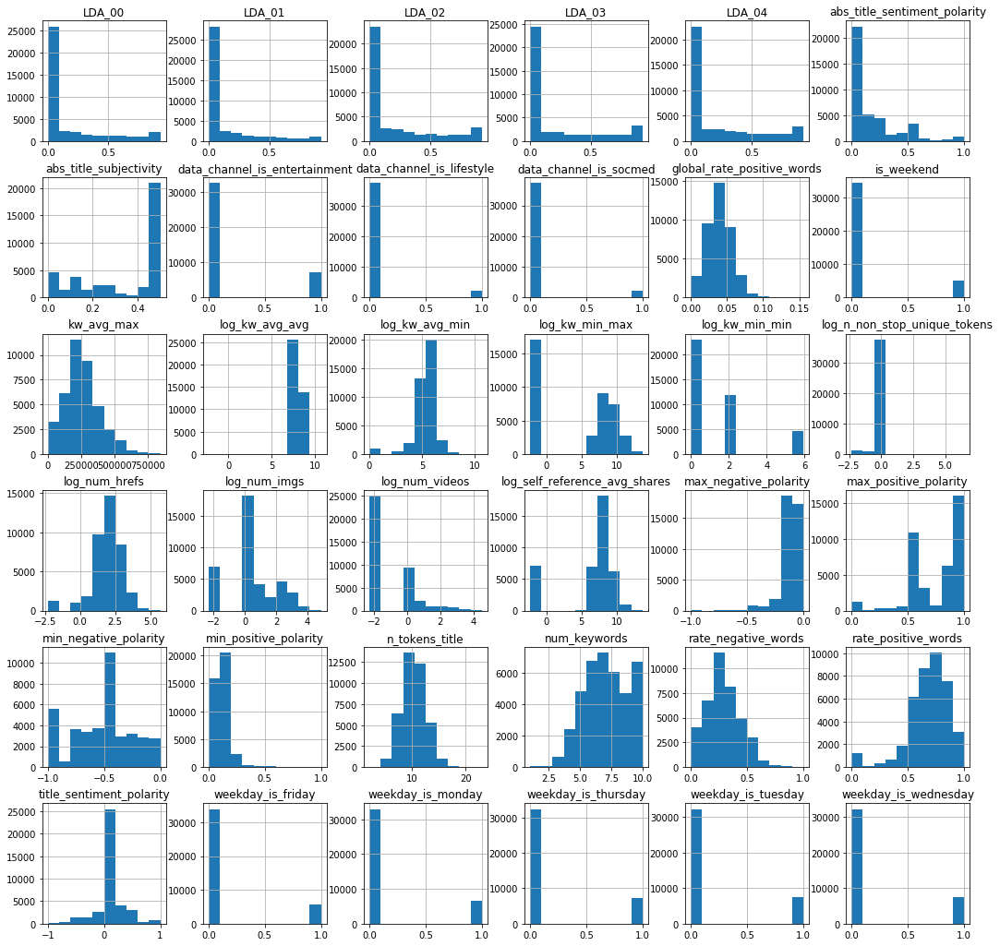

In [17]:
df.hist(figsize=(18,18))

##### Get correlation heatmap

In [18]:
# sns.heatmap(df.corr(), annot=False)
# plt.rcParams["figure.figsize"] = [12,12]
# plt.show()

##### 2.2.3 Important attribute - title_sentiment_polarity

From the initial data collection and pre-processing for this dataset carried out by K. Fernandes et al. for their online news popularity study, it is apparent that they intended to incorporate sentiment analysis into their clustering model by including attributes such as rate_positive_words and avg_negative_polarity. An essential task when performing sentiment analysis is classifying the polarity of a given text at the article, sentence, or even attribute level. The sentiment polarity is a verbal representation of the sentiment which can be 'negative', 'neutral', or 'positive'. The sentiment score is a more precise numerical representation of the sentiment polarity based on a linear score ranging from -1 (negative) to 1 (positive). In more intuitive terms, we are trying to understand the intensity of certain emotions, e.g. joy or anger, invoked by readers when reading the an article.

In the case of the title_sentiment_polarity attribute, we are trying to gauge whether the title of an article results in a negative or positive sentiment for the readers. Since this attribute was included in our final linear regression model presented at the bottom of the Summary Statistics section, we wanted to understand how much it influences the popularity of an article. The horizontal side-by-side boxplot below compares the distribution between articles that are classified as popular (True - dark blue) or not (False - orange) based on the 1,400 shares / 7.24 log shares cutoff.

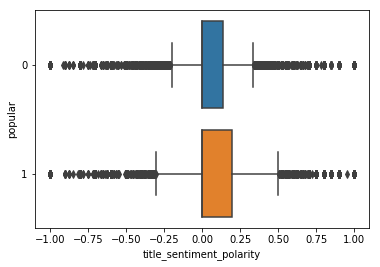

In [19]:
# Horizontal side-by-side boxplot for title sentiment polarity versus article popularity 
sns.boxplot(y = "popular", x = "title_sentiment_polarity",  orient = "h", data = df)
plt.rcParams["figure.figsize"] = [6,3]

##### 2.2.4 Important attribute - LDA

LDA (in this context) refers to a method by which a body of text can be scored relative to a vocabulary set that is identified with specific topics. A body of text that discusses Machine Learning, for instance, will use vocabulary specific to that topic, and quite different from another text which discusses do-it-yourself home repair. A text can be scored relative to the similarity of a given LDA scale and then compared among other texts for similarity or difference.  

This data set includes measures for 5 LDA topics, identified here as : _LDA_00_, _LDA_01_, ... and _LDA_04_.  
Similar to the above visualization, we choose to review the relative visual correlation among the LDA scores of these articles via scatter plots, this time with each LDA score plotted against _LDA_00_ (vs. _LDA_01_, _LDA_02_, etc.) and a basic histogram of each individual distribution. These are shown in the below plots.  

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a25904e10>,
      dtype=object)

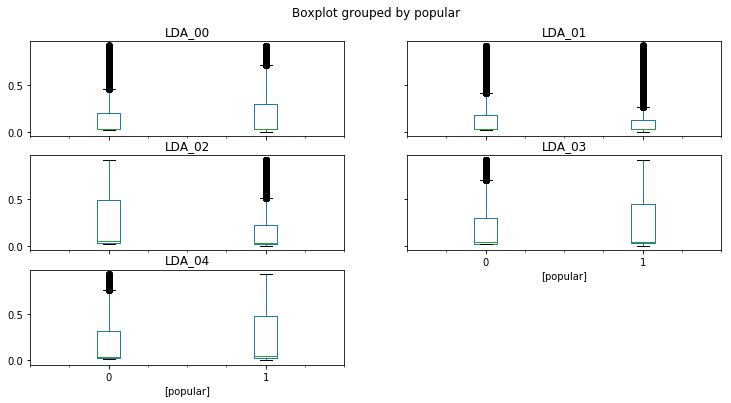

In [20]:
df.boxplot(['LDA_00', 'LDA_01', 'LDA_02','LDA_03', 'LDA_04'], grid=False, by=['popular'], figsize=(12,6))
plt.show()

##### 2.2.5 Important attribute - Day of the week

The Weekday attribute was the most obvious trend that we noticed right away. The barplot below demonstrates that the number of articles published during the week is greater than the weekend. Drawing an anecdotal parallel to the typical workweek, this pattern seems to represent the productivity of white collar office workers where Monday starts off slower and picks up mid-week and eventually drops off by the weekend which might also be the case for publishers sucha as Mashable. This barplot doesn't give us an insight into the effect that publishing on a certain weekday has on the popularity of an article.

The side by side plot below breaks out whether the article is popular (True - yellow bar) or not (False - blue bar) and assigns it to the corresponding weekday during which it was published.

The interesting trend that we noticed here is that the proportion of popular articles tends to be higher during the weekend than during the week. A possible explanation for this could be that a typical reader has more leisure time during the weekend to get through several articles and is more likely to share them on social media.

This difference in the ratio of popular to unpopular articles is important to understand as it could influence the clustering model prediction.

<Figure size 576x288 with 0 Axes>

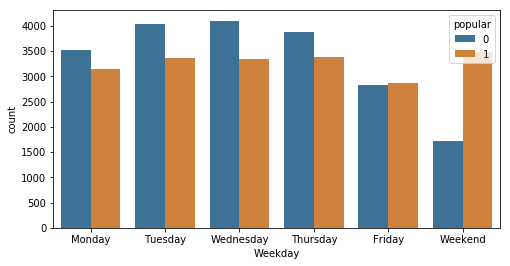

In [21]:
# Combine and make 'Weekday' with 7 weekday variables
Monday_df=df[df['weekday_is_monday']==1].copy()
Monday_df['Weekday']='Monday'

Tuesday_df=df[df['weekday_is_tuesday']==1].copy()
Tuesday_df['Weekday']='Tuesday'

Wednesday_df=df[df['weekday_is_wednesday']==1].copy()
Wednesday_df['Weekday']='Wednesday'

Thursday_df=df[df['weekday_is_thursday']==1].copy()
Thursday_df['Weekday']='Thursday'

Friday_df=df[df['weekday_is_friday']==1].copy()
Friday_df['Weekday']='Friday'

Weekend_df=df[df['is_weekend']==1].copy()
Weekend_df['Weekday']='Weekend'

df_week=pd.concat([Monday_df,Tuesday_df,Wednesday_df,Thursday_df,Friday_df, Weekend_df],axis=0)

plt.figure(figsize=(8,4))
sns.countplot('Weekday', hue = 'popular', saturation=0.6, data = df_week)

##### 2.2.6 Important attribute - Data Channel

The *Channel* attribute is another one that we immediately noticed a strong relationship. The horizontal barchart below shows a direct comparison in the number of articles published for each data channel. We can see that the *lifestyle* category has the lowest number of articles published for this data set while the *World* category has the highest number. 

Again, this chart only provides part of the picture. It would seem that publishers such as Mashable are catering to their readers with respect to the type of content they provide. For this reason we need to take a closer look at what proportion of articles are considered popular within each channel.

The plot below highlights some interesting differences in the ratio of popular articles for each of data channels. Even though the *World* channel has the most articles published in this data set, it also has the largest number of unpopular articles which is closely followed by the *Entertainment* channel. On the other hand, the *Tech*, *Socmedia*, and *Lifestyle* channels have higher proportions of popular articles. This might be a result of the readers having a greater personal interest, such as a hobby, in these channels making them more likely to share the article on social media. 

<Figure size 576x288 with 0 Axes>

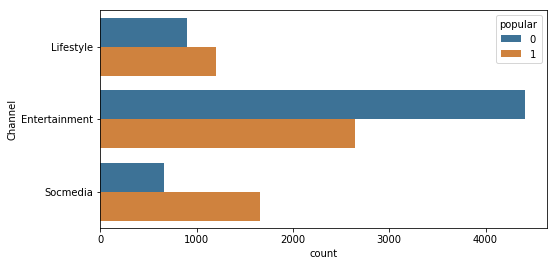

In [22]:
# Combine and make 'channel' with 6 data_channel variables
Lifestyle_df=df[df['data_channel_is_lifestyle']==1].copy()
Lifestyle_df['Channel']='Lifestyle'

Entertainment_df=df[df['data_channel_is_entertainment']==1].copy()
Entertainment_df['Channel']='Entertainment'

Socmed_df=df[df['data_channel_is_socmed']==1].copy()
Socmed_df['Channel']='Socmedia'

df_channel=pd.concat([Lifestyle_df,Entertainment_df,Socmed_df],axis=0)


plt.figure(figsize=(8,4))
sns.countplot(y='Channel', hue = 'popular', saturation=0.6, data = df_channel)

##### 2.2.7 Important attribute - Digital Media

We all often hear the phrase "a picture says a thousand words" so it would be interesting to see whether that holds true for this data set. Since we already examined the distribution for the number of images (*num_imgs*) and videos (*num_videos*) per article in the **Summary Statistics** section, we wanted to tie in the *channel* attribute discussed above.

The first violin plot below shows the log transformed number of images categorized by the data channel and with the distribution color coded by whether the article is popular or not. It seems that most of the channels are trimodal with the exception of the business channel. Comparing the distributions of the popular versus unpopular articles, there doesn't seem to be any obvious deviations which suggests that this attribute might not have a strong influence on the popularity. 

<Figure size 576x288 with 0 Axes>

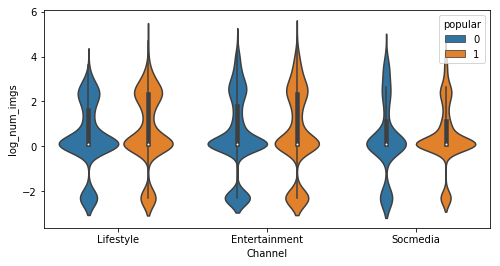

In [23]:
# Violin plot of popular versus unpopular articles measured by log_num_images categorized by data channel
plt.figure(figsize=(8,4))

sns.violinplot(x = "Channel", y = "log_num_imgs", hue = "popular", data = df_channel)

The same violin plot was created for the log transformed numer of videos. The main difference here when comparing to the images plot above is that most of the channels have a weak bimodal distribution. The entertainment channel two strong peaks throughout it's distribution suggesting these articles typically have more videos included in comparison to other channels. Again, there is no obvious differentiation between the popular and unpopular articles.

<Figure size 576x288 with 0 Axes>

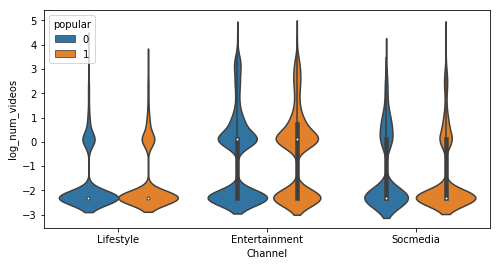

In [24]:
# Violin plot of popular versus unpopular articles measured by log_num_videos categorized by data channel
plt.figure(figsize=(8,4))
sns.violinplot(x = "Channel", y = "log_num_videos", hue = "popular", data = df_channel)

##### 2.2.8. Important attribute - Natural Language Processing

The natural language processing attributes in this data set require some research to gain an understanding into what they represent. Prior to performing a lot of research into these attributes, we find some obvious trends that could possibly be explained without the domian knowledge.

The kernel density estimation plot below shows that the rate of positive words (left-hand side) is almost a mirror image of the rate of negative words (right-hand side) of an article. It would seem that including both of these attributes in a clustering model could potentially lower its prediction. It would be interesting to test this is theory when we build our model. 

<Figure size 720x360 with 0 Axes>

Text(0.5, 0, 'Rate of positive words')

Text(0, 0.5, 'Frequency')

Text(0.5, 0, 'Rate of negative words')

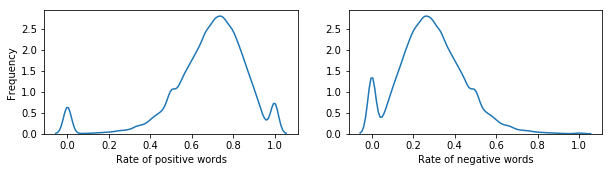

In [25]:
# kde plot for rate of positive words
plt.figure(figsize=(10,5))

plt.subplot(2, 2, 1)
sns.kdeplot(np.array(df['rate_positive_words']))
plt.xlabel('Rate of positive words')
plt.ylabel('Frequency')

# kde plot for rate of negative words
plt.subplot(2, 2, 2)
sns.kdeplot(np.array(df['rate_negative_words']))
plt.xlabel('Rate of negative words')

##### 2.2.9. Important attribute  -Number of Words

We wanted to understand if the number of words in an article, be it the title or the body, has an obvious relationship with how popular it is. 

First, we looked at the distribution of the number of words in the title (*n_tokens_title*). The plot below displays a normal distribution with the peak frequency right around the 10 word count mark.

<Figure size 576x288 with 0 Axes>

Text(0.5, 0, 'Number of words in the title')

Text(0, 0.5, 'Frequency')

Text(0.5, 1.0, 'Distribution of Title Word Count')

(0, 20)

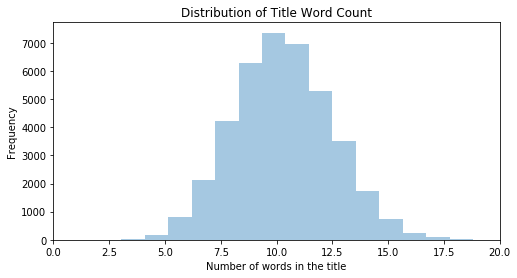

In [26]:
# distribution plot of title word count
plt.figure(figsize=(8,4))
ax = sns.distplot(df['n_tokens_title'], bins = 20, kde = False)
plt.xlabel('Number of words in the title')
plt.ylabel('Frequency')
plt.title('Distribution of Title Word Count')
ax.set_xlim(0, 20)

<a id='ModelandEvaluation1'></a>
### Section 3.1 -  Model and Evaluation 1 - Train and adjust Parameters (10 points)

Train and adjust parameters.

[Back to top](#BacktoTop)

#### This section includes:

   * [3.1.1 - Dmensionality reduction](#DmensionalityReduction)
   * [3.1.2 - Train and adjust clustering algorithm](#TrainAdjustCA)
   * [3.1.3 - Evaluation](#Evaluation)
   * [3.1.4 - Visualization and summarization](#VisualizationSummarization)

<a id='DmensionalityReduction'></a>

#### 3.1.1 Dimensionality reduction

There are 36 attributes/features in the base dataset to start from eliminating multicollinearity by filtering absolute pairwise correlation coefficients >= 0.65. 

We also used several generalized rules to identify and apply a log transformation to the necessary attributes in our data set. One such rule involves applying a log transformation to attributes for which the maximum value is more than 10 times large than the median value (labelled as the 50% value in the code snippet below). Another rule involves adding a fixed integer of +0.1 for distributions that start at zero or +2 to any negative values for attributes that were log transformed since those are invalid arguments to use for the logarithmic function.

As described in previous Data Understanding sections([Section 2.1](#DataUnderstanding1), and [Section 2.2](#DataUnderstanding2)), there are no missing values and heavy outliers. Histograms for these 35 features show nearly normal distribution though there are a couple of skewed attributes (like left-skewed LDA01, LDA_02, LDA_03). We believe the large amount of records (39,644) will help address any concern about skewness or uneven distribution for those attributes. 

We initially tried to use this dataset to perform cluster analysis with methods ( k-means, DBSCAN, and Spectral Clustering) directly without dimensionality reduction, but hardly continue the computation because of 39,644 observations taking up too much memory and CPU.

##### Dimensionality reduction with PCA or t-SNE

In this project, we will focus on t-SNE for dimensionality reduction and compare it with PCA in several ways. 

For t-SNE, the cost function parameter settings ('perplexity', 'kl_divergence', and 'number of iterations') are employed to evaluate the t-SNE method which minimizes the sum of Kullback-Leibler divergences (kl_divergence) over all data points.

Besides t-SNE, we also tested PCA in [Section 3.2.2.1 K-Means clustering via PCA](#PCADR) and [Section 5 Exceptional work](#ExceptionalWork51).

After dimensionality reduction, we perform analysis using several clustering methods with adjust parameters.
  - Non-Hierarchical: K-means ([Section 3.2.2.1](#PCADR), [Section3.2.2.2](#tSNEDR), Spectral [Section 3.2.3](#SpectralClustering))
  - Hierarchical with linkage type: Complete [Section 3.2.4.1](#HCCompleteLinkage), Average ([Section 3.2.4.2](##HCAverageLinkage), Ward ([Section 3.2.4.3](#HCAverageLinkage)).

**(1). Dimensionality reduction with PCA:**

PCA is an unsupervised, linear and parametric algorithm that creates linear combinations of the original features for reducing the number of dimensions in a dense dataset while retaining most information. Dimensionality reduction can be achieved by limiting the number of principal components to keep based on cumulative explained variance. PCA is a versatile technique that works well in practice. PCA produces rotational transformation of the original data for preserving distances which is important to apply distance-based (e.g. k-means) clustering algorithms.  

**(2). Dimensionality reduction with t-SNE:**

The t-SNE algorithm is a nonlinear dimensionality reduction technique in sklearn to visualize and understand high-dimensional data, by reducing the dimensional space of 2 or 3 dimensions so that it can be plotted easily and preserve local similarities. 

t-SNE converts similarities between data points to joint probabilities and tries to minimize the Kullback-Leibler divergence between the joint probabilities of the low-dimensional embedding and the high-dimensional data. In addition, t-SNE has a cost function that is not convex, i.e. with different initializations we can get different results.

t-SNE is a manifold technique that does not preserve distances nor density. Therefore, it is not recommended to run distance-based (e.g. k-means) or density-based (e.g. DBSCAN) clustering algorithms on the output of t-SNE. Therefore, we need to use this method with caution.

In the sci-kit learn implementation of t-SNE, the cost function parameter settings ('**perplexity**', '**kl_divergence**', and '**number of iterations**') are employed in this project to evaluate the t-SNE method which minimizes the sum of Kullback-Leibler divergences (kl_divergence) over all data points using a gradient descent method. In our analysis, during the perplexity in the range of 5 to 100, the performance of t-SNE is fairly robust to changes.

In this project, we use t-SNE cost function parameters ('n_components' = 2, perplexity from 5 to 100, verbose = 0, n_iter = 300) for hyper parameter tuning to evaluate model performance. The optimal perplexity is 50 and  kl_divergence is 2.81. The complete dimensions of the dataset (39,644) is used to run the algorithm. The computed t-SNE maps for all values of perplexity were saved and are available for use in the subsequent clustering applications. The indices of the sampled rows were retained and written back to the saved data set of t-SNE vectors, matching from the full dataset during the later evaluation to be completed after the clustering analyses.

[Back to top](#BacktoTop)

<a id='TrainAdjustCA'></a>

#### 3.1.2 Train and adjust clustering algorithm

After dimensionality reductions with PCA or/and t-SNE, we employ three different clustering methods (k-means clustering, spectral clustering and hierarchical clustering) for clustering analysis.

These three methods have fundamental differences and we assessed that they can provide different opportunities to identify different resulting cluster definitions.

The ***KMeans*** algorithm clusters data by trying to separate samples in n groups of equal variances, minimizing a criterion known as the ***inertia*** which can be recognized as a measure of how internally coherent clusters are.

After loading the stored t-SNE vectors from the previously completed t-SNE mapping along with the reference indices, we initiate the cluster analysis with the k-means clustering (init = 'k-means++'), the number of clusters is from 5 to 16 (perplexity = 50 for t-SNE), and other parameters (max_iter=300, tol=0.0001, random_state = 1).

The **spectral clustering** techniques make use of the spectrum (eigenvalues) of the similarity matrix of the data to perform dimensionality reduction before clustering in fewer dimensions. **Spectral Clustering** is very useful when the structure of the individual clusters is highly non-convex or more generally when a measure of the center and spread of the cluster is not a suitable description of the complete cluster. 

Similar to how to implemente in K-Means cluster analysis, we initiate the spectral clustering (eigen_solver='arpack' and affinity = 'rbf'), the number of clusters is selected from 5 to 16 (perplexity = 50 for t-SNE). When calling fit, an affinity matrix is constructed using kernel function the Gaussian (aka RBF) kernel of the euclidean distanced.

The **Hierarchical clustering** is depicted by dendrogram. Here we 3 of 4 linkages (**complete, average, ward and single**) linkage for hierarchical agglomerative clustering with the basic idea to repeatedly merge two most similar groups as measured by the linkage. **Complete** linkage measures the farthest pair of points, **average** linkage measures the average dissimilarity over all pairs, and **ward** linkage measures how much the sum of squares will increase when we merge two clusters. 

With similar implementation,  we create dendogram to identify optimal clusters under each method.

[Back to top](#BacktoTop)

<a id='Evaluation'></a>
#### 3.1.3 Evaluation or validation

Evaluation (or "validation") of clustering results is as difficult as the clustering itself. Popular approaches involve "internal" evaluation, where the clustering is summarized to a single quality score, "external" evaluation, where the clustering is compared to an existing "ground truth" classification.

In this project, we use silhouette coefficient as internal validation measures to describe and compare the clustering methods and the clusters. The Silhouette Coefficient is calculated using the mean intra-cluster distance (a) and the mean nearest-cluster distance (b) for each sample.

[Back to top](#BacktoTop)

<a id='VisualizationSummarization'></a>

#### 3.1.4 Visualization and summarization

In this project, we use tables and plots to visualize and summarize the results, followed by further discussions.

[Back to top](#BacktoTop)

<a id='ModelandEvaluation2'></a>
### Section 3.2 -  Model and Evaluation 2 - Evaluate and Compare(10 points)

Evaluate and Compare

[Back to top](#BacktoTop)

   * [3.2.1 - Dimensionality reduction with PCA or t-SNE](#DimensionalityReduction)
   * [3.2.2 - K-Means clustering via PCA or t-SNE](#KMeansClustering)
     * [3.2.2.1 - K-Means clustering via PCA](#PCADR)
     * [3.2.2.2 - K-Means clustering via t-SNE](#tSNEDR)
   * [3.2.3 - Spectral clustering via t-SNE](#SpectralClustering)
   * [3.2.4 - Hierarchical clustering via t-SNE](#HierarchicalClustering)   
     * [3.2.4.1 - Complete linkage](#HCCompleteLinkage) 
     * [3.2.4.2 - Average linkage](#HCAverageLinkage)
     * [3.2.4.3 - Ward linkage](#HCAverageLinkage)
     * [3.2.4.4 - Hierarchical Model Summary](#HCModelSummary)

<a id='DimensionalityReduction'></a>
#### 3.2.1 - Dimensionality reduction with PCA and t-SNE


Datasets with high dimensions/features are subjected to what is called as curse of dimensionality. This problem pushed researchers to explore dimensionality reduction procedures such as Principal Component Analysis (PCA), t-distributed stochastic neighbor embedding (t-SNE), and others. 

Dimensionality Reduction is the process of reducing the dimensions of data without losing much of information. In this project, we apply these two most popular techniques for dimensionality reduction: PCA and t-SNE.

**(1). Dimensionality reduction with PCA:**

PCA is an unsupervised, linear and parametric algorithm that creates linear combinations of the original features for reducing the number of dimensions in a dense dataset while retaining most information. It is using the correlation between some dimensions and tries to provide a minimum number of variables that keeps the maximum amount of variation or information about how the original data is distributed. The new features are orthogonal and ranked in order of explained variance. Therefore, you can reduce dimensionality by limiting the number of principal components to keep based on cumulative explained variance. For example, you might decide to keep only as many principal components as needed to reach a cumulative explained variance of 90%.

When considering some extreme values, skewed distributions, and several dummy variables, one should always normalize the dataset before performing PCA because the transformation is dependent on scale. Otherwise, the features that are on the largest scale would dominate the new principal components.

PCA is a versatile technique that works well in practice. It's fast and simple to implement and offers several variations and extensions to tackle specific roadblocks. However, the new principal components are not interpretable, and need to manually set or tune a threshold for cumulative explained variance. When PCA is used for dimensional reduction by projecting into a lower dimensional space by throwing out factors with small eigenvectors, only a small amount of information about distance is lost.

PCA produces rotational transformation of the original data for preserving distances which is important to apply distance-based (e.g. k-means) clustering algorithms.  

**(2). Dimensionality reduction with t-SNE:**

The t-SNE algorithm is a nonlinear dimensionality reduction technique in sklearn to visualize and understand high-dimensional data, by reducing the dimensional space of 2 or 3 dimensions so that it can be plotted easily and preserve local similarities. 


t-SNE converts similarities between data points to joint probabilities and tries to minimize the Kullback-Leibler divergence between the joint probabilities of the low-dimensional embedding and the high-dimensional data. In addition, t-SNE has a cost function that is not convex, i.e. with different initializations we can get different results.

t-SNE is a manifold technique that does not preserve distances nor density. Therefore, it is not recommended to run distance-based (e.g. k-means) or density-based (e.g. DBSCAN) clustering algorithms on the output of t-SNE.

[Back to top](#BacktoTop)

<a id='KMeansClustering'></a>
#### 3.2.2 K-Means clustering via PCA and t-SNE
[Back to top](#BacktoTop)

<a id='PCADR'></a>
#### 3.2.2.1 K-Means clustering via PCA

***PCA*** is a widely used statistical technique for unsupervised dimension reduction, and ***K-means clustering*** is a commonly used data clustering for unsupervised learning tasks. Here, we show that principal components are the continuous solutions to the discrete cluster membership indicators for K -means clustering. 

The ***KMeans*** algorithm clusters data by trying to separate samples in n groups of equal variances, minimizing a criterion known as the ***inertia*** (within-cluster sum-of-squares) which can be recognized as a measure of how internally coherent clusters are. This algorithm requires the number of clusters to be specified. It scales well to large number of samples and has been used across a large range of application areas in many different fields.

In sklearn, there are two options for parameter ***'init'*** for class sklearn.cluster: ***’k-means++’*** or ***'random'***. ***‘k-means++’*** selects initial cluster centers for k-mean clustering in a smart way to speed up convergence, and ***‘random’*** chooses k observations (rows) at random from data for the initial centroids.

The ***Silhouette Coefficient*** is calculated using the mean intra-cluster distance (a) and the mean nearest-cluster distance (b) for each sample. The Silhouette Coefficient for a sample is (b - a) / max(a, b). The best value is 1 and the worst value is -1. Values near 0 indicate overlapping clusters. Negative values generally indicate that a sample has been assigned to the wrong cluster, as a different cluster is more similar.

In this section, the ***Silhouette Coefficients*** for initiation ('init') with k-means is 0.354, 'random' is 0.061 and 'PCA-based' is 0.055. The color plot shows the K-means clustering with PCA-reduced **Online News Popularity**  dataset and the centroids are marked with white cross.

[Back to top](#BacktoTop)

Automatically created module for IPython interactive environment
n_targets: 2, 	 n_samples 39644, 	 n_features 36
_____________________________________________________________________________________
init		time	inertia	homo	compl	v-meas	ARI	AMI	silhouette
random   	1.10s	1347181	0.006	0.006	0.006	0.008	0.006	0.061
k-means++	1.23s	1319720	0.000	0.001	0.000	0.000	0.000	0.354
PCA-based	0.09s	1347185	0.006	0.006	0.006	0.008	0.006	0.055
_____________________________________________________________________________________


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

<Figure size 432x432 with 0 Axes>

Text(0.5, 1.0, 'K-means clustering with PCA-reduced ONP dataset)\nCentroids are marked with white cross')

(-5.557990696334007, 11.306933206287338)

(-6.714378343736442, 9.08083671865937)

([], <a list of 0 Text xticklabel objects>)

([], <a list of 0 Text yticklabel objects>)

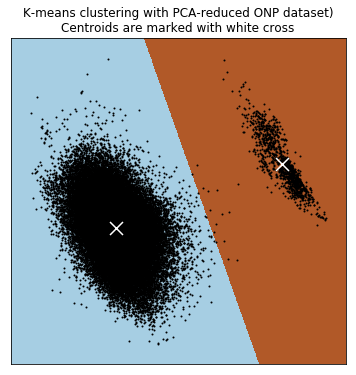

In [27]:
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
print(__doc__)

# normalize the dataset with scale
df_pca = df.copy()

Xp = df_pca.drop('popular',axis=1)
X = scale(Xp)
y = df_pca['popular']

n_samples, n_features = X.shape

n_targets = len(np.unique(df_pca['popular']))
labels = df_pca['popular']

sample_size = 500

print("n_targets: %d, \t n_samples %d, \t n_features %d" % (n_targets, n_samples, n_features))

print(85 * '_')
print('init\t\ttime\tinertia\thomo\tcompl\tv-meas\tARI\tAMI\tsilhouette')

# define function bench_k_means
def bench_k_means(estimator, name, data):
    t0 = time()
    estimator.fit(X)
    print('%-9s\t%.2fs\t%i\t%.3f\t%.3f\t%.3f\t%.3f\t%.3f\t%.3f'
          % (name, (time() - t0), estimator.inertia_,
             mt.homogeneity_score(labels, estimator.labels_),
             mt.completeness_score(labels, estimator.labels_),
             mt.v_measure_score(labels, estimator.labels_),
             mt.adjusted_rand_score(labels, estimator.labels_),
             mt.adjusted_mutual_info_score(labels, estimator.labels_, average_method='max'),
             mt.silhouette_score(data, estimator.labels_, metric='euclidean', sample_size=sample_size)))

bench_k_means(KMeans(init='random', n_clusters=n_targets, n_init=10), name="random", data = X)
bench_k_means(KMeans(init='k-means++', n_clusters=n_targets, n_init=10), name="k-means++", data = X)

# KMeans algorithm with n_init=1 for the seeding of the centers
pca = PCA(n_components = n_targets).fit(X)
bench_k_means(KMeans(init=pca.components_, n_clusters=n_targets, n_init=1), name="PCA-based", data = X)

print(85 * '_')

# visualize the results on PCA-reduced data
reduced_data = PCA(n_components=2).fit_transform(X)
kmeans = KMeans(init='k-means++', n_clusters=n_targets, n_init=10)
kmeans.fit(reduced_data)

# refine size of the mesh [x_min, x_max]x[y_min, y_max]
h = 0.02

# plot the decision boundary by assigned color to each
x_min, x_max = reduced_data[:, 0].min() - 1, reduced_data[:, 0].max() + 1
y_min, y_max = reduced_data[:, 1].min() - 1, reduced_data[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# obtain labels for each point in mesh and use last trained model
Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])

# put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(1, figsize = (6, 6))
plt.clf()
plt.imshow(Z, interpolation='nearest', extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap=plt.cm.Paired, aspect='auto', origin='lower')

plt.plot(reduced_data[:, 0], reduced_data[:, 1], 'k.', markersize=2)

# plot the centroids as a white X
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], marker='x', s=169, linewidths=3, color='w', zorder=10)
plt.title('K-means clustering with PCA-reduced ONP dataset)\n'
          'Centroids are marked with white cross')
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
plt.show()

### <a id='tSNEDR'></a>
####  3.2.2.2 - t-SNE for dimensionality reduction

t-SNE is a tool to visualize high-dimensional data. It is highly recommended to use another dimensionality reduction method (e.g. PCA for dense data or TruncatedSVD for sparse data) to reduce the number of dimensions to a reasonable amount (e.g. 50) if the number of features is very high. This will suppress some noise and speed up the computation of pairwise distances between samples.

In this project, we have reduced to 36 features after eliminating multicollinearity by filtering absolute pairwise correlation coefficients >= 0.65 (see [section 2.1](#DataUnderstanding1)). In addition, we tried how to combine PCA and t-SNE in the exceptional works ([section 5](#ExceptionalWork)).

In preparation, we normalize the dataset before performing t-SNE to prevent that some features on the largest scale would dominate the results. The normalized data as shown in the dataset description are at reasonable ranges.

The cost function parameter seetings ('**perplexity**', '**kl_divergence**', and '**number of iterations**') are employed in this project to evaluate the t-SNE method which minimizes the sum of Kullback-Leibler divergences (kl_divergence) over all data points using a gradient descent method. 

**Perplexity (Perp)** is the conditional probability distribution induced by a Gaussian kernel. It can be interpreted as a smooth measure of the effective number of neighbors. The performance of SNE is fairly robust to changes in the perplexity, and typical values are between 5 and 50.

**The number of iterations (n_iter)** compute low-dimensional data representation in gradients

**The 'kl_divergence'** represents the number of nearest neighbors employed in a neighborhood graph. 

In this project, we use t-SNE cost function parameters ('n_components' = 2, perplexity from 5 to 100, verbose = 0, n_iter = 300) for hyper parameter tuning to evaluate model performance. The optimal perplexity is 50 and  kl_divergence is 2.81.


We first tried to run the algorithm on the different dimensions of the data and see how it does. To make sure we don’t burden our machine in terms of memory and power/time, we will use 30% of all samples (11,893 of 39,644 observations) to make sure the algorithm does not take up too much memory and CPU.

Now that we have the two resulting dimensions, we can again visualize them by creating a scatter plot of the two dimensions and coloring each sample by its respective label.

[Back to top](#BacktoTop)

In [28]:
# prepare dataset for t-SNE for dimensionality reduction

from sklearn.preprocessing import StandardScaler

df_cluster = df.copy()
scaler = StandardScaler()
X = df_cluster.drop('popular',axis=1)
y = df_cluster['popular']
X = scaler.fit_transform(X)

In [29]:
# dataframe containing the source variable columns
df_cluster = pd.DataFrame(data=X,columns=df_cluster.columns[1:])

# df_cluster.head(10)
df_cluster.describe()

,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,weekday_is_friday,...,log_n_non_stop_unique_tokens,log_num_hrefs,log_num_imgs,log_num_videos,log_kw_min_min,log_kw_avg_min,log_kw_min_max,log_kw_avg_avg,log_self_reference_avg_shares,popular
count,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,...,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04
mean,9.870760e-16,4.569434e-15,3.396464e-14,1.470213e-14,1.077641e-14,1.574005e-15,2.053876e-15,-7.161420e-16,-3.323769e-15,-6.761567e-16,...,3.228199e-16,-1.870453e-15,-6.539859e-15,1.278536e-14,2.491716e-14,9.437353e-14,-4.050057e-16,-3.856306e-14,-1.976668e-15,6.477463e-15
std,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,...,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00
min,-3.972899e+00,-3.260042e+00,-2.364450e-01,-4.653587e-01,-2.494870e-01,-1.919178e+00,-4.493913e-01,-4.786636e-01,-4.804541e-01,-4.737610e-01,...,-6.896581e-01,-5.313924e+00,-3.795880e+00,-1.663615e+00,-7.123649e-01,-6.776711e-01,-4.682076e+00,-1.127381e+00,-1.806715e+01,-2.068298e+00
25%,-6.616566e-01,-6.410154e-01,-2.364450e-01,-4.653587e-01,-2.494870e-01,-6.397832e-01,-4.493913e-01,-4.786636e-01,-4.804541e-01,-4.737610e-01,...,-6.896581e-01,-5.113835e-02,-4.801946e-01,-1.772306e-01,-7.123649e-01,-6.776711e-01,-2.950543e-01,-1.127381e+00,-3.437783e-01,1.543325e-01
50%,-1.886220e-01,-1.172101e-01,-2.364450e-01,-4.653587e-01,-2.494870e-01,-1.088798e-01,-4.493913e-01,-4.786636e-01,-4.804541e-01,-4.737610e-01,...,-6.896581e-01,1.757393e-01,1.277306e-01,-1.772306e-01,-7.123649e-01,-6.776711e-01,1.483142e-01,5.665152e-01,-1.633596e-02,3.495721e-01
75%,7.574472e-01,9.304005e-01,-2.364450e-01,-4.653587e-01,-2.494870e-01,5.307015e-01,-4.493913e-01,-4.786636e-01,-4.804541e-01,-4.737610e-01,...,4.151124e-01,3.829365e-01,6.226503e-01,6.383186e-01,8.721427e-01,3.562300e-01,5.131474e-01,8.735266e-01,3.822393e-01,5.575754e-01
max,5.960828e+00,1.454206e+00,4.229313e+00,2.148880e+00,4.008224e+00,4.322840e+00,2.225232e+00,2.089150e+00,2.081364e+00,2.110769e+00,...,3.729424e+00,1.799851e+01,3.364773e+00,2.771804e+00,3.790624e+00,2.748472e+00,4.735563e+00,1.702200e+00,4.766770e+00,1.788086e+00


In [30]:
# print source rariable column names
col_names = df_cluster.columns.values.tolist()
col_names

['num_keywords',
 'data_channel_is_lifestyle',
 'data_channel_is_entertainment',
 'data_channel_is_socmed',
 'kw_avg_max',
 'weekday_is_monday',
 'weekday_is_tuesday',
 'weekday_is_wednesday',
 'weekday_is_thursday',
 'weekday_is_friday',
 'is_weekend',
 'LDA_00',
 'LDA_01',
 'LDA_02',
 'LDA_03',
 'LDA_04',
 'global_rate_positive_words',
 'rate_positive_words',
 'rate_negative_words',
 'min_positive_polarity',
 'max_positive_polarity',
 'min_negative_polarity',
 'max_negative_polarity',
 'title_sentiment_polarity',
 'abs_title_subjectivity',
 'abs_title_sentiment_polarity',
 'log_n_non_stop_unique_tokens',
 'log_num_hrefs',
 'log_num_imgs',
 'log_num_videos',
 'log_kw_min_min',
 'log_kw_avg_min',
 'log_kw_min_max',
 'log_kw_avg_avg',
 'log_self_reference_avg_shares',
 'popular']

In [31]:
# set required variables for clustering model comparison
tsne_table = pd.DataFrame(columns = ['model_name','perplexity','kl_divergence','process_time'])

i_index = []
i_index = 0

# each classifier is appended once model is fit
models = []

11893

98.079664
/Users/shanqinggu/Desktop/tSNE_files/lab3/t_sne_mapping_perplex__0005_20181202_200325.csv
97.113126
/Users/shanqinggu/Desktop/tSNE_files/lab3/t_sne_mapping_perplex__0010_20181202_200421.csv
104.90666500000003
/Users/shanqinggu/Desktop/tSNE_files/lab3/t_sne_mapping_perplex__0020_20181202_200526.csv
108.26775799999996
/Users/shanqinggu/Desktop/tSNE_files/lab3/t_sne_mapping_perplex__0050_20181202_200628.csv
128.90585500000003
/Users/shanqinggu/Desktop/tSNE_files/lab3/t_sne_mapping_perplex__0100_20181202_200742.csv


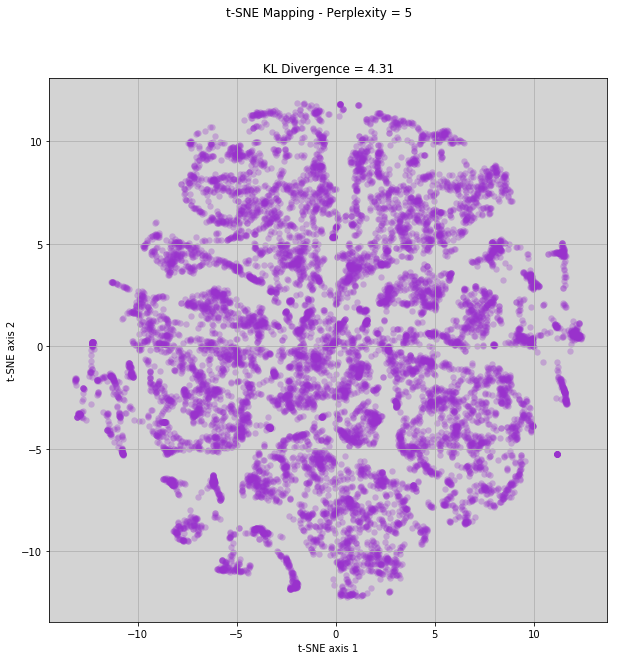

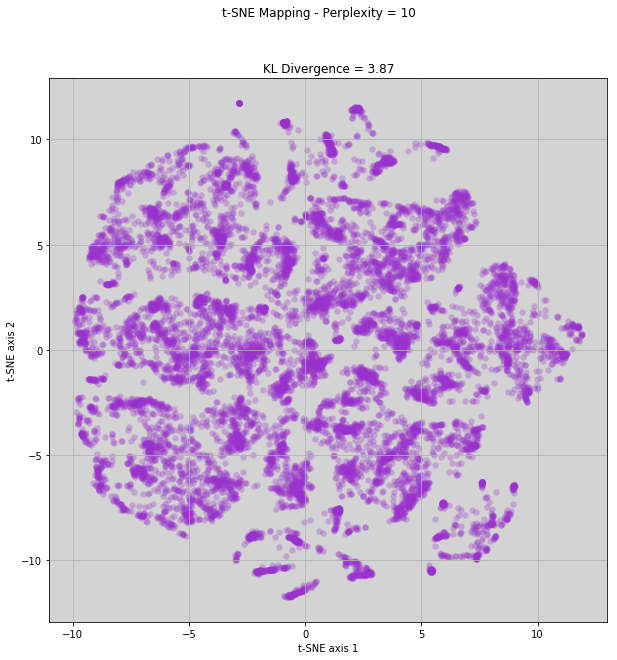

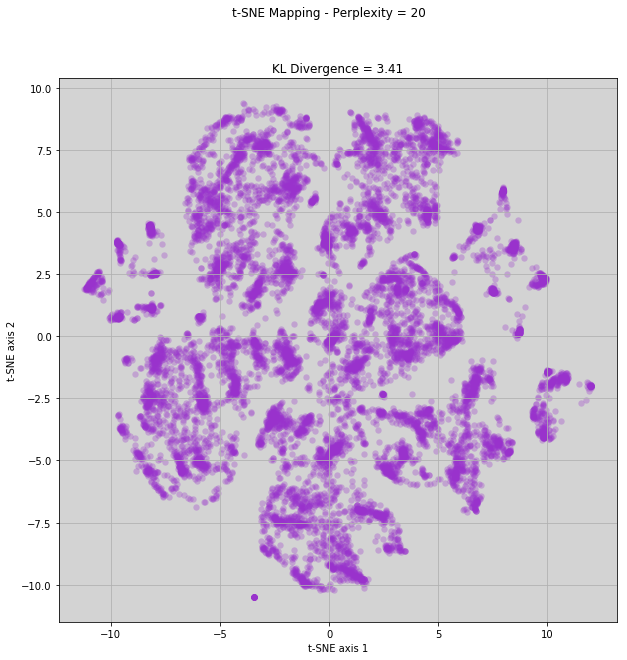

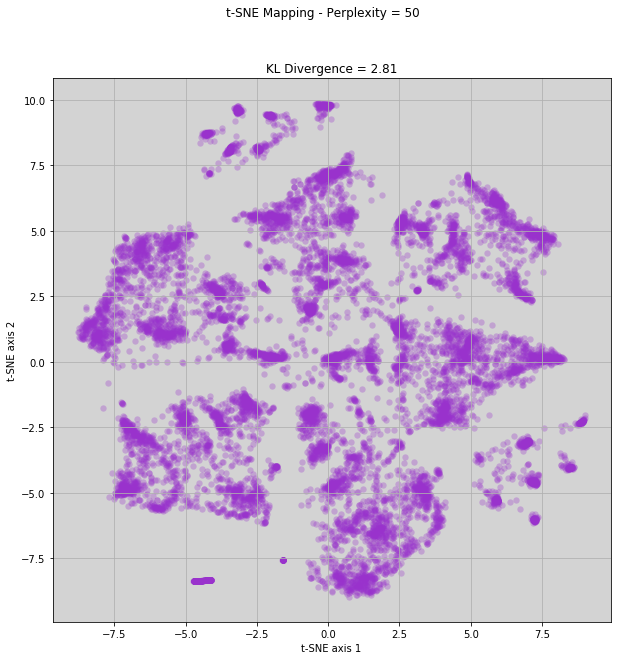

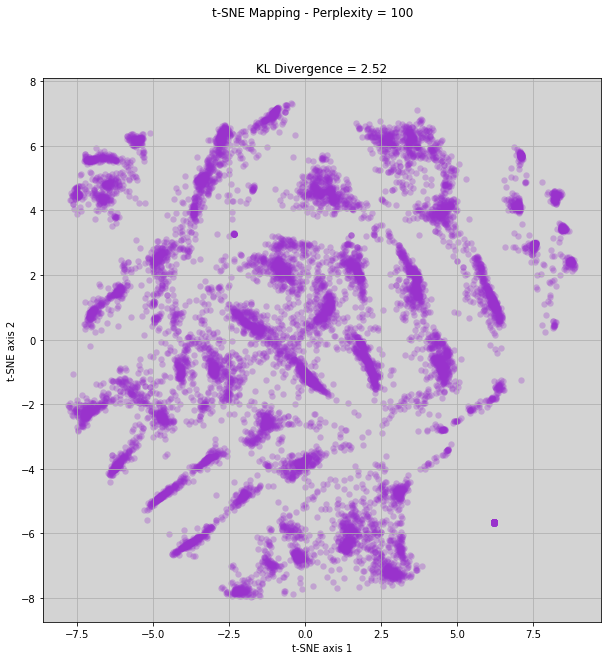

In [32]:
# dimensionality reduction via t-SNE (checking the optimal perplex value from 5 to 100)
import time
from sklearn.manifold import TSNE

X2 = df_cluster
X2 = X2.sample(frac = 0.3) # use fractional dataset for memory / CPU consideration


# save indexes from original dataframe for later re-joins
X2_index = list(X2.index.values)
len(X2_index)

df_out = pd.DataFrame(columns = ['x-tsne', 'y-tsne'])
df_out['sample_index'] = X2_index

# for loop to evaluate range of perplexity values (default perplexity = 50)
for perplex in [5, 10, 20, 50, 100]:
    i_index = i_index + 1
    
    time_start = time.clock()
    
    tsne = TSNE(n_components = 2, perplexity = perplex, verbose = 0, n_iter = 300)        
    tsne_results = tsne.fit_transform(X2)
    tsne_kl_diverge = tsne.kl_divergence_
    
    time_end = time.clock()
    print(time_end - time_start)
    
# save parameter statistics for model comparison
    exe_time = '{0:.4f}'.format(time_end-time_start)
    
    raw_data = {'model_name': 'tSNE','perplexity': perplex,'kl_divergence': tsne_kl_diverge,'process_time' : exe_time}

    df_table = pd.DataFrame(raw_data, 
                            columns = ['model_name', 'perplexity', 'kl_divergence', 'process_time'],
                            index = [i_index])
    
    tsne_table = tsne_table.append(df_table)

# plot clusters to compare with parameter statistics
    _ = plt.figure(figsize = (10, 10))
    _ = plt.subplot(111, facecolor = 'lightgrey')    
    _ = plt.scatter(tsne_results[:, 0], tsne_results[:, 1], s = 40, c = 'darkorchid', linewidths = 0, alpha = 0.30)    
    _ = plt.xlabel('t-SNE axis 1')
    _ = plt.ylabel('t-SNE axis 2')        
    _ = plt.suptitle("t-SNE Mapping - Perplexity = %d" %perplex)
    _ = plt.title("KL Divergence = %.2f" %tsne_kl_diverge)
    _ = plt.grid(True)
    
# store data in .csv reacall file
    df_out['x-tsne'] = tsne_results[:,0];
    df_out['y-tsne'] = tsne_results[:,1];

    df_dir = '/Users/shanqinggu/Desktop/tSNE_files/lab3/'
    df_name = "t_sne_mapping_perplex_"
    df_num = "_%04d_" %perplex
    df_time = datetime.now().strftime("%Y%0m%0d_%H%M%S")
    df_ext = ".csv"
    file_tsne = df_dir + df_name + df_num + df_time + df_ext
    
    print(file_tsne)

    df_out.to_csv(file_tsne, index = False)

In [33]:
# get the selected file from t-SNE mapping
df_dir = '/Users/shanqinggu/Desktop/tSNE_files/lab3/'
file_select = 't_sne_mapping_perplex__0050_20181202_200628.csv'
file_tsne_select = df_dir + file_select
df_tsne = pd.read_csv(file_tsne_select)
df_tsne.head()

,x-tsne,y-tsne,sample_index
0,-8.093482,1.963363,26296
1,0.322223,6.678409,5968
2,-3.171860,8.270056,7190
3,-2.747311,-2.047174,7130
4,-2.047462,9.418406,17420


In [34]:
# join t-sne vectors with base data for t-SNE mapping
df_join = df_tsne.join(df_cluster, on = 'sample_index')
df_join.head()

,x-tsne,y-tsne,sample_index,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,weekday_is_monday,weekday_is_tuesday,...,log_n_non_stop_unique_tokens,log_num_hrefs,log_num_imgs,log_num_videos,log_kw_min_min,log_kw_avg_min,log_kw_min_max,log_kw_avg_avg,log_self_reference_avg_shares,popular
0,-8.093482,1.963363,26296,-0.188622,1.454206,-0.236445,-0.465359,-0.249487,-0.399421,-0.449391,...,-0.689658,-0.000077,0.683829,-0.177231,0.872143,-0.677671,0.049866,-1.127381,-0.122259,0.181970
1,0.322223,6.678409,5968,1.230482,-0.641015,-0.236445,-0.465359,-0.249487,-0.127426,-0.449391,...,1.519883,0.408834,-0.285326,-0.177231,-0.712365,0.356230,0.278413,-1.127381,-0.266842,0.718240
2,-3.171860,8.270056,7190,-0.661657,-0.117210,4.229313,-0.465359,-0.249487,-0.994152,-0.449391,...,1.519883,0.473597,-1.077560,-1.663615,0.872143,0.356230,1.154855,-1.127381,-0.125205,-2.068298
3,-2.747311,-2.047174,7130,0.284413,-0.117210,-0.236445,2.148880,-0.249487,-0.965602,2.225232,...,0.415112,0.465708,-1.077560,-0.177231,-0.712365,0.356230,0.682374,-1.127381,-0.440850,-2.068298
4,-2.047462,9.418406,17420,-0.661657,-1.164821,4.229313,-0.465359,-0.249487,-0.269887,-0.449391,...,-0.689658,0.170256,1.063416,-0.177231,0.872143,-0.677671,-0.905598,-1.127381,-0.534133,0.357545


In [35]:
# print column names and file description
col_names = df_join.columns.values.tolist()
col_names
df_join.describe().T.head()

['x-tsne',
 'y-tsne',
 'sample_index',
 'num_keywords',
 'data_channel_is_lifestyle',
 'data_channel_is_entertainment',
 'data_channel_is_socmed',
 'kw_avg_max',
 'weekday_is_monday',
 'weekday_is_tuesday',
 'weekday_is_wednesday',
 'weekday_is_thursday',
 'weekday_is_friday',
 'is_weekend',
 'LDA_00',
 'LDA_01',
 'LDA_02',
 'LDA_03',
 'LDA_04',
 'global_rate_positive_words',
 'rate_positive_words',
 'rate_negative_words',
 'min_positive_polarity',
 'max_positive_polarity',
 'min_negative_polarity',
 'max_negative_polarity',
 'title_sentiment_polarity',
 'abs_title_subjectivity',
 'abs_title_sentiment_polarity',
 'log_n_non_stop_unique_tokens',
 'log_num_hrefs',
 'log_num_imgs',
 'log_num_videos',
 'log_kw_min_min',
 'log_kw_avg_min',
 'log_kw_min_max',
 'log_kw_avg_avg',
 'log_self_reference_avg_shares',
 'popular']

,count,mean,std,min,25%,50%,75%,max
x-tsne,11893.0,-0.024313,4.489026,-8.771065,-3.666459,0.002644,3.565357,9.009777
y-tsne,11893.0,0.020710,4.678900,-8.967864,-3.865202,0.204198,3.854493,9.869983
sample_index,11893.0,19863.457832,11479.229059,0.000000,9783.000000,19883.000000,29858.000000,39643.000000
num_keywords,11893.0,-0.003314,1.002087,-3.972899,-0.661657,-0.188622,0.757447,4.068690
data_channel_is_lifestyle,11893.0,-0.002478,0.996971,-3.260042,-0.641015,-0.117210,0.930401,1.454206


<a id='KMeansClustering'></a>
#### 3.2.2.2 K-Means clustering via t-SNE

The **KMeans** algorithm clusters data by trying to separate samples in n groups of equal variances, minimizing a criterion known as the inertia (within-cluster sum-of-squares) which can be recognized as a measure of how internally coherent clusters are. This algorithm requires the number of clusters to be specified. 


**'inertia'** is the sum of squared distances of samples to their closest cluster center. **'tol'** is the relative tolerance with regards to inertia to declare convergence.

The **Silhouette Coefficient** is calculated using the mean intra-cluster distance (a) and the mean nearest-cluster distance (b) for each sample. The Silhouette Coefficient for a sample is (b - a) / max(a, b). The best value is 1 and the worst value is -1. Values near 0 indicate overlapping clusters. Negative values generally indicate that a sample has been assigned to the wrong cluster, as a different cluster is more similar.

In this project, the silhouette analysis is used to choose an optimal value for n_clusters from 6 to 16. The silhouette plot shows that the optimal n_clusters value is 15 (silhouette =  0.4585).

[Back to top](#BacktoTop)

In [36]:
# set required variables for model comparison
kmeans_table = pd.DataFrame(columns = ['model_name', 'n_clusters', 'inertia', 'silhouette', 'process_time'])

i_index = []
i_index = 0

# preparation for cross validation and model comparison, each classifier is appended once model is fit
models = []

In [37]:
# select cluster range for K-means via t-SNE with initiation 'k-means++''
X_tsne = pd.DataFrame(columns=['t1', 't2'])
X_tsne['t1'] = df_join['x-tsne']
X_tsne['t2'] = df_join['y-tsne']

for n_clusters in range(6, 16): 
    
    tic = time.clock()
    
    print ("\n n_clusters = ", n_clusters)

    km_clusters = KMeans(n_clusters = n_clusters, init = 'k-means++', max_iter=300, tol=0.0001, random_state = 1);
    
    km_clusters.fit(X_tsne)

    kmeans_labels = km_clusters.labels_ 
    kmeans_centers = km_clusters.cluster_centers_

    kmeans_inertia = km_clusters.inertia_
    print ("inertia = ", kmeans_inertia)
    
    kmeans_silhouette = mt.silhouette_score(X_tsne, kmeans_labels, metric = 'euclidean',sample_size = 10000)
    
    print ("silhouette = ", kmeans_silhouette)
    
    toc =  time.clock()

# save statistics for model comparison
    exe_time = '{0:.4f}'.format(toc-tic)
    
    raw_data = {'model_name' : 'KMeans - LDA features', 'n_clusters' : n_clusters, 'inertia': kmeans_inertia,
                'silhouette': kmeans_silhouette, 'process_time' : exe_time}

    df_table = pd.DataFrame(raw_data,
    columns = ['model_name', 'n_clusters', 'inertia', 'silhouette', 'process_time'],
    index = [i_index + 1])

    kmeans_table = kmeans_table.append(df_table, ignore_index=True)


 n_clusters =  6


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=6, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  86837.31855621678
silhouette =  0.4033561061739492

 n_clusters =  7


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=7, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  65858.00671403005
silhouette =  0.4524462473916873

 n_clusters =  8


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=8, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  56873.92971238414
silhouette =  0.4579528742171931

 n_clusters =  9


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=9, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  50022.4319134378
silhouette =  0.45751131362699426

 n_clusters =  10


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  43397.867919415556
silhouette =  0.4477079216078734

 n_clusters =  11


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=11, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  39593.22854914576
silhouette =  0.44850861306577033

 n_clusters =  12


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=12, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  35009.13145071709
silhouette =  0.45589833486921455

 n_clusters =  13


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=13, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  32725.135059278484
silhouette =  0.44837845483762157

 n_clusters =  14


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=14, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  30114.516693153142
silhouette =  0.43516415394967434

 n_clusters =  15


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=15, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  27365.1016074382
silhouette =  0.45849609227653093


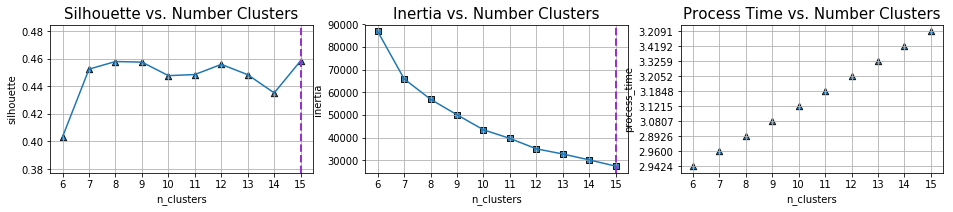

In [38]:
# the optimal cluster is decided by max silhouette score

import math

n_optimal_clusters = kmeans_table['silhouette'].idxmax() + kmeans_table['n_clusters'].min()

# plot metrics across models for comparison
plt.figure(figsize=(16, 6));

# silhouette values
plt.subplot(231);
plt.scatter(kmeans_table['n_clusters'], kmeans_table['silhouette'], s = 40, linewidths = 1.0, marker = '^',
            edgecolors = 'black', alpha = 0.90);

plt.plot(kmeans_table['n_clusters'], kmeans_table['silhouette'])

plt.xlabel('n_clusters'), plt.ylabel('silhouette');
plt.title('Silhouette vs. Number Clusters', fontsize = 15)
plt.grid();

# mark max silhouette value with vertical line
plt.axvline(x = n_optimal_clusters, linewidth = 2, linestyle = 'dashed', color = 'darkorchid')
xint = range(min(kmeans_table['n_clusters']), math.ceil(max(kmeans_table['n_clusters']))+1)
plt.xticks(xint)

# inertia values
plt.subplot(232);
plt.scatter(kmeans_table['n_clusters'], kmeans_table['inertia'], s = 40, linewidths = 1.0, marker = ',',
            edgecolors = 'black', alpha = 0.90);

plt.plot(kmeans_table['n_clusters'],kmeans_table['inertia'])

plt.xlabel('n_clusters'), plt.ylabel('inertia');
plt.title('Inertia vs. Number Clusters', fontsize = 15)
plt.grid();

# mark max silhouette value with vertical line
plt.axvline(x = n_optimal_clusters, linewidth = 2, linestyle = 'dashed', color = 'darkorchid')
xint = range(min(kmeans_table['n_clusters']), math.ceil(max(kmeans_table['n_clusters']))+1)
plt.xticks(xint)

# processing time
plt.subplot(233);
plt.scatter(kmeans_table['n_clusters'], kmeans_table['process_time'], s = 40, linewidths = 1.0, marker = '^',
            edgecolors = 'black', alpha = 0.90);
plt.xlabel('n_clusters'), plt.ylabel('process_time');
plt.title('Process Time vs. Number Clusters', fontsize = 15)
plt.grid();

xint = range(min(kmeans_table['n_clusters']), math.ceil(max(kmeans_table['n_clusters']))+1)
plt.xticks(xint)

plt.show();

n_clusters =  15


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=15, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  27365.1016074382
silhouette =  0.4569350819446967


<Figure size 864x864 with 0 Axes>

Text(5.342914606307815, -0.3191954730956267, '0')

0 5.342914606307815 -0.3191954730956267 0


Text(-3.50153588458943, -3.0100894259842508, '1')

1 -3.50153588458943 -3.0100894259842508 1


Text(-0.46603321552046917, 5.557959221075455, '2')

2 -0.46603321552046917 5.557959221075455 2


Text(6.578703792136498, 4.618153701335309, '3')

3 6.578703792136498 4.618153701335309 3


Text(1.8539173103048263, -6.63221026104996, '4')

4 1.8539173103048263 -6.63221026104996 4


Text(-7.026157209206801, 1.352999629155524, '5')

5 -7.026157209206801 1.352999629155524 5


Text(-4.0259194182012825, -7.849188585010707, '6')

6 -4.0259194182012825 -7.849188585010707 6


Text(1.0074858885468034, 0.9675657541592743, '7')

7 1.0074858885468034 0.9675657541592743 7


Text(7.205471711440675, -4.171126852966105, '8')

8 7.205471711440675 -4.171126852966105 8


Text(-6.114434624858753, 4.011004768361579, '9')

9 -6.114434624858753 4.011004768361579 9


Text(0.2462054963771206, -3.2171540309768654, '10')

10 0.2462054963771206 -3.2171540309768654 10


Text(-2.427021324834108, 8.973474742880796, '11')

11 -2.427021324834108 8.973474742880796 11


Text(-6.478227327417022, -3.993841705771999, '12')

12 -6.478227327417022 -3.993841705771999 12


Text(3.7925761171701096, 4.876184901907787, '13')

13 3.7925761171701096 4.876184901907787 13


Text(-2.974652221293801, 1.3645550287437993, '14')

14 -2.974652221293801 1.3645550287437993 14
[ 5  2 11 ...  1  5  1]
[[ 5.34291461 -0.31919547]
 [-3.50153588 -3.01008943]
 [-0.46603322  5.55795922]
 [ 6.57870379  4.6181537 ]
 [ 1.85391731 -6.63221026]
 [-7.02615721  1.35299963]
 [-4.02591942 -7.84918859]
 [ 1.00748589  0.96756575]
 [ 7.20547171 -4.17112685]
 [-6.11443462  4.01100477]
 [ 0.2462055  -3.21715403]
 [-2.42702132  8.97347474]
 [-6.47822733 -3.99384171]
 [ 3.79257612  4.8761849 ]
 [-2.97465222  1.36455503]]


(Text(0.5, 0, 't1'), Text(0, 0.5, 't2'))

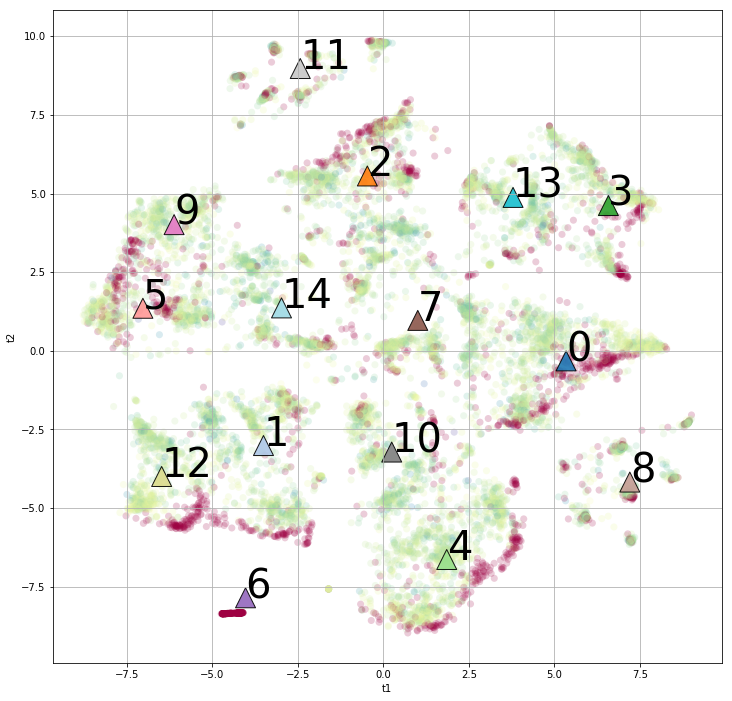

In [39]:
# optimal clusters with inertia and silhouette values and plot the clusters

n_clusters_chosen = n_optimal_clusters

for n_clusters in [n_clusters_chosen] :

    tic = time.clock()
    
    print ("n_clusters = ", n_clusters)

    km_clusters = KMeans(n_clusters = n_clusters, init = 'k-means++', random_state = 1);
    
    km_clusters.fit(X_tsne)
    
    kmeans_labels = km_clusters.labels_
    kmeans_centers = km_clusters.cluster_centers_

    kmeans_inertia = km_clusters.inertia_
    print ("inertia = ", kmeans_inertia)
    
    kmeans_silhouette = mt.silhouette_score(X_tsne, kmeans_labels, metric = 'euclidean', sample_size = 10000)
    print ("silhouette = ", kmeans_silhouette)
    
    toc =  time.clock()

# plot clusters
    plt.figure(figsize=(12, 12));
    ax = plt.gca();
    
    X_tsne_values = X_tsne.values;
    plt.scatter(X_tsne_values[:, 0], X_tsne_values[:, 1], c = df_join['popular'], cmap = plt.cm.Spectral,
                s = 50, linewidths = 0, alpha = 0.20);
    plt.scatter(kmeans_centers[:, 0], kmeans_centers[:, 1], c = range(n_clusters), cmap = plt.cm.tab20,
                s = 400, linewidths = 1.0, marker = '^', edgecolors = 'black', alpha = 0.90);  
    
    for ii in range(n_clusters):  
        plt.text(kmeans_centers[ii, 0], kmeans_centers[ii, 1], ii, fontsize = 40)
        print(ii, kmeans_centers[ii, 0], kmeans_centers[ii, 1], ii)

    print(kmeans_labels)
    print(kmeans_centers)
        
    plt.xlabel('t1'), plt.ylabel('t2');
    plt.grid();

    plt.show();

<a id='SpectralClustering'></a>

#### 3.2.3. Spectral clustering 

**spectral clustering** techniques make use of the spectrum (eigenvalues) of the similarity matrix of the data to perform dimensionality reduction before clustering in fewer dimensions. The similarity matrix is provided as an input and consists of a quantitative assessment of the relative similarity of each pair of points in the dataset.

**Spectral Clustering** is very useful when the structure of the individual clusters is highly non-convex or more generally when a measure of the center and spread of the cluster is not a suitable description of the complete cluster. For instance, when clusters are nested circles on the 2D plan.

If affinity is the adjacency matrix of a graph, this method can be used to find normalized graph cuts. When calling fit, an affinity matrix is constructed using either kernel function such the Gaussian (aka RBF) kernel of the euclidean distanced or a k-nearest neighbors connectivity matrix. Alternatively, using precomputed, a user-provided affinity matrix can be used.

In this project, we use **eigen_solver='arpack' and affinity = 'rbf'** to select clusters in range (6, 16) and evaluate the model performance by **'inertia'** and **'silhouette'** as shown in [section 3.2.2](#KMeansClustering).

In this project, the silhouette analysis is used to choose an optimal value for n_clusters from 6 to 16. The silhouette plot shows that the optimal n_clusters value is 15 (silhouette = 0.4477).

[Back to top](#BacktoTop)

In [61]:
# set required variables for model comparison
spectral_table = pd.DataFrame(columns = ['model_name','n_clusters','inertia','silhouette','process_time'])

i_index = []
i_index = 0

# each classifier is appended once model is fit
models = []

In [62]:
# select cluster range for spectral clustering s via t-SNE with eigen_solver='arpack' and affinity = 'rbf'

from sklearn.cluster import SpectralClustering
from __future__ import print_function

from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm

print(__doc__)

X_tsne = pd.DataFrame(columns=['t1', 't2'])
X_tsne['t1'] = df_join['x-tsne']
X_tsne['t2'] = df_join['y-tsne']

for n_clusters_spectral in range(6, 16):   

    tic = time.clock()
    
    print ("n_clusters = ", n_clusters_spectral)

    spc = SpectralClustering(n_clusters = n_clusters_spectral, eigen_solver='arpack', affinity = 'rbf')
    spc_labels = spc.fit_predict(X_tsne) 
    spc_labels
    spc_silhouette = mt.silhouette_score(X_tsne, spc_labels, metric = 'euclidean', sample_size = 10000)
    print ("silhouette = ", spc_silhouette)
    
    toc =  time.clock()

# save statistics for model comparison
    exe_time = '{0:.4f}'.format(toc-tic)
    
    raw_data = {'model_name' : 'spc - features','n_clusters' : n_clusters_spectral,'inertia': 0,'silhouette': spc_silhouette,'process_time' : exe_time}

    df_table = pd.DataFrame(raw_data,
    columns = ['model_name', 'n_clusters', 'inertia', 'silhouette', 'process_time'],
    index = [i_index + 1])

    spectral_table = spectral_table.append(df_table, ignore_index=True)

Automatically created module for IPython interactive environment
n_clusters =  6


array([1, 0, 2, ..., 5, 1, 5], dtype=int32)

silhouette =  0.24479645587244414
n_clusters =  7


array([5, 3, 2, ..., 4, 5, 4], dtype=int32)

silhouette =  0.32306775506551044
n_clusters =  8


array([0, 1, 3, ..., 2, 0, 2], dtype=int32)

silhouette =  0.34357782930412994
n_clusters =  9


array([4, 7, 2, ..., 3, 4, 3], dtype=int32)

silhouette =  0.4340824356749482
n_clusters =  10


array([5, 9, 2, ..., 7, 5, 7], dtype=int32)

silhouette =  0.4356147940513008
n_clusters =  11


array([ 3,  8,  5, ..., 10,  3,  7], dtype=int32)

silhouette =  0.4247004789132077
n_clusters =  12


array([2, 7, 5, ..., 0, 2, 8], dtype=int32)

silhouette =  0.42101144822041014
n_clusters =  13


array([ 3,  8,  7, ..., 12,  3, 10], dtype=int32)

silhouette =  0.43181148847858847
n_clusters =  14


array([ 2,  0,  6, ..., 10,  2,  7], dtype=int32)

silhouette =  0.41004412352299696
n_clusters =  15


array([ 5,  1,  4, ...,  2,  5, 10], dtype=int32)

silhouette =  0.44703467439701156


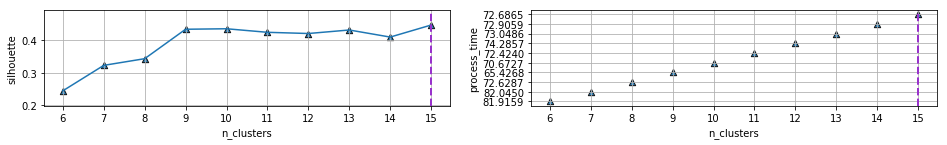

In [63]:
import math

# use max silhouette score to mark optimal number of clusters
n_optimal_clusters = spectral_table['silhouette'].idxmax() + spectral_table['n_clusters'].min()

# plot metrics across models for comparison
plt.figure(figsize=(16, 6));

# silhouette values
plt.subplot(321);
plt.scatter(spectral_table['n_clusters'], spectral_table['silhouette'], s = 40, linewidths = 1.0, marker = '^', edgecolors = 'black', alpha = 0.90);

plt.plot(spectral_table['n_clusters'], spectral_table['silhouette'])

# vertical line at max silhouette value
plt.axvline(x = n_optimal_clusters, linewidth = 2, linestyle = 'dashed', color = 'darkorchid')

plt.xlabel('n_clusters'), plt.ylabel('silhouette');
xint = range(min(spectral_table['n_clusters']), math.ceil(max(spectral_table['n_clusters']))+1)
plt.xticks(xint)

plt.grid();

# processing time
plt.subplot(322);
plt.scatter(spectral_table['n_clusters'], spectral_table['process_time'], s = 40, linewidths = 1.0, marker = '^', edgecolors = 'black', alpha = 0.90);

# mark max silhouette value with vertical line
plt.axvline(x = n_optimal_clusters, linewidth = 2, linestyle = 'dashed', color = 'darkorchid')

plt.xlabel('n_clusters'), plt.ylabel('process_time');
xint = range(min(spectral_table['n_clusters']), math.ceil(max(spectral_table['n_clusters']))+1)
plt.xticks(xint)

plt.grid();
plt.show();

In [64]:
# max silhouette value occurs at 8, but similar scores across the range from 7 - 10
n_clusters_chosen = n_optimal_clusters

for n_clusters_spectral in range(n_clusters_chosen, n_clusters_chosen+1):   

    tic = time.clock()
    
    print ("n_clusters = ", n_clusters_spectral)

    spc = SpectralClustering(n_clusters = n_clusters_spectral, eigen_solver='arpack', affinity = 'rbf')
    spc_labels = spc.fit_predict(X_tsne) 
    spc_labels
    spc_silhouette = mt.silhouette_score(X_tsne, spc_labels, metric = 'euclidean', sample_size = 10000)
    print ("silhouette = ", spc_silhouette)
    
    toc =  time.clock()

n_clusters =  15


array([ 5, 12,  7, ..., 14,  5,  4], dtype=int32)

silhouette =  0.44769635691520443


<a id='HierarchicalClustering'></a>

#### 3.2.4. Hierarchical Clustering

**Hierarchical clustering**, as depicted by a tree or dendrogram, can be divided into agglomerative ("from the bottom up") and divisive clustering ("from the top down"). 

There are four linkages (**complete, average, ward and single**) linkage for hierarchical agglomerative clustering with the basic idea to repeatedly merge two most similar groups as measured by the linkage. **Complete** linkage measures the farthest pair of points, **average** linkage measures the average dissimilarity over all pairs, **ward** linkage measures how much the sum of squares will increase when we merge two clusters, and **single** linkage measures the closest pair of points. 

In this project, the hierarchical clustering with linkage 'average' has the highest silhouette value (silhouette = 0.3833). 

[Back to top](#BacktoTop)

In [65]:
# create table for comparison of models
HC_table = pd.DataFrame(columns = ['HC model', 'n_clusters', 'silhouette', 'processing time'])

i_index = []
i_index = 0

# each classifier is appended once model is fit
models = []

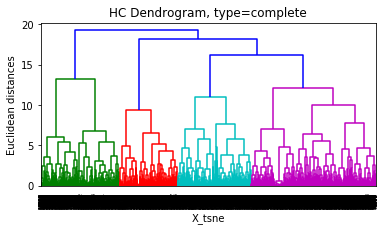

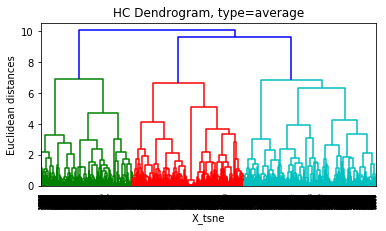

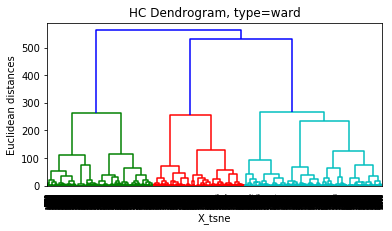

In [66]:
# compare methods with four different linkages ('complete', 'average', 'ward', 'single')
from scipy.cluster.hierarchy import dendrogram, linkage
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering

# get optimal cluster numbers with method 'complete'
dendrogram = sch.dendrogram(sch.linkage(X_tsne, method = 'complete'))
_ = plt.title('HC Dendrogram, type=complete')
_ = plt.xlabel('X_tsne')
_ = plt.ylabel('Euclidean distances')
_ = plt.show()

# get optimal cluster numbers with method 'average'
dendrogram = sch.dendrogram(sch.linkage(X_tsne, method = 'average'))
_ = plt.title('HC Dendrogram, type=average')
_ = plt.xlabel('X_tsne')
_ = plt.ylabel('Euclidean distances')
_ = plt.show()

# get optimal cluster numbers with method 'ward'
dendrogram = sch.dendrogram(sch.linkage(X_tsne, method = 'ward'))
_ = plt.title('HC Dendrogram, type=ward')
_ = plt.xlabel('X_tsne')
_ = plt.ylabel('Euclidean distances')
_ = plt.show()

In [67]:
# optimal cluster for each linkage
n_optimal_cluster_complete = 4
n_optimal_cluster_average = 3
n_optimal_cluster_ward = 3

<a id='HCCompleteLinkage'></a>

#### 3.2.4.1 Hierarchical clustering with linkage = 'complete' (silhouette =  0.3063)

[Back to top](#BacktoTop)

In [68]:
# HC model for optimal cluster numbers with linkage = 'complete'

tic = time.clock()

hc_complete = AgglomerativeClustering(n_clusters = n_optimal_cluster_complete, affinity = 'euclidean', linkage = 'complete')
hc_complete.fit(X_tsne)

hc_labels_complete = hc_complete.labels_ 

hc_silhouette = mt.silhouette_score(X_tsne, hc_labels_complete, metric = 'euclidean', sample_size = 10000)
print ("silhouette = ", hc_silhouette)

toc =  time.clock()

# save statistics for model comparison
exe_time = '{0:.4f}'.format(toc-tic)

raw_data = {'HC model': 'Complete', 'n_clusters': n_optimal_cluster_complete, 'silhouette': hc_silhouette, 'processing time': exe_time
}

df_tbl = pd.DataFrame(raw_data, columns = ['HC model', 'n_clusters', 'silhouette', 'processing time'], index = [i_index + 1])

HC_table = HC_table.append(df_tbl, sort=False)

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='complete', memory=None,
            n_clusters=4, pooling_func='deprecated')

silhouette =  0.30635280540512533


<a id='HCAverageLinkage'></a>

#### 3.2.4.2 Hierarchical clustering with linkage= 'average' (silhouette =  0.3833, the best)

[Back to top](#BacktoTop)

In [69]:
# HC model for optimal cluster numbers with linkage = 'average'

tic = time.clock()

hc_average = AgglomerativeClustering(n_clusters = n_optimal_cluster_average, affinity = 'euclidean', linkage = 'average')
hc_average.fit(X_tsne)

hc_labels_average = hc_average.labels_ 

hc_silhouette = mt.silhouette_score(X_tsne, hc_labels_average, metric = 'euclidean', sample_size = 10000)
print ("silhouette = ", hc_silhouette)

toc =  time.clock()

# save statistics for model comparison
exe_time = '{0:.4f}'.format(toc-tic)

raw_data = {'HC model': 'Average','n_clusters': n_optimal_cluster_average, 'silhouette': hc_silhouette,'processing time' : exe_time
}

df_tbl = pd.DataFrame(raw_data, columns = ['HC model', 'n_clusters', 'silhouette', 'processing time'], index = [i_index + 1])

HC_table = HC_table.append(df_tbl, sort=False)

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='average', memory=None,
            n_clusters=3, pooling_func='deprecated')

silhouette =  0.38334691219628175


<a id='HCWardLinkage'></a>
#### 3.2.4.3. Hierarchical clustering with linkage = 'ward' (silhouette =  0.3753)
[Back to top](#BacktoTop)

In [70]:
# HC model for optimal cluster numbers with linkage = 'ward'

tic = time.clock()

hc_ward = AgglomerativeClustering(n_clusters = n_optimal_cluster_ward, affinity = 'euclidean', linkage = 'ward')
hc_ward.fit(X_tsne)

hc_labels_ward = hc_ward.labels_ 

hc_silhouette = mt.silhouette_score(X_tsne, hc_labels_ward, metric = 'euclidean', sample_size = 10000)
print ("silhouette = ", hc_silhouette)

toc =  time.clock()

# save statistics for model comparison
exe_time = '{0:.4f}'.format(toc-tic)

raw_data = {'HC model' :'Ward', 'n_clusters' : n_optimal_cluster_ward, 'silhouette': hc_silhouette, 'processing time': exe_time
}

df_tbl = pd.DataFrame(raw_data, columns = ['HC model', 'n_clusters', 'silhouette', 'processing time'], index = [i_index + 1])

HC_table = HC_table.append(df_tbl, sort=False)    

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='ward', memory=None, n_clusters=3,
            pooling_func='deprecated')

silhouette =  0.3753031126733814


<a id='HCModelSummary'></a>

#### 3.2.4.4 Hierarchical Model Summary

[Back to top](#BacktoTop)

In [71]:
HC_table = HC_table.reset_index(drop=True)
HC_table['processing time'] = pd.to_numeric(HC_table['processing time'])
HC_table

,HC model,n_clusters,silhouette,processing time
0,Complete,4,0.306353,6.9922
1,Average,3,0.383347,7.4763
2,Ward,3,0.375303,6.8123


#### Hierarchical clusters with 3 linkages

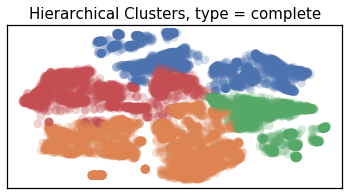

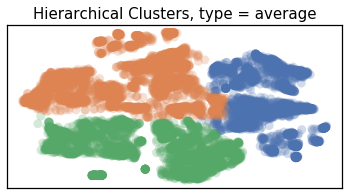

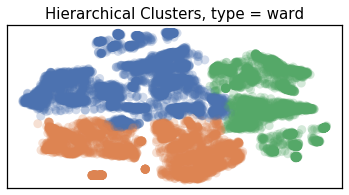

In [72]:
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
sns.set_color_codes()
plot_kwds = {'alpha' : 0.25, 's' : 80, 'linewidths':0}

palette = sns.color_palette('deep', np.unique(hc_labels_complete).max() + 1)
colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in hc_labels_complete]
X_tsne_values = X_tsne.values;
_= plt.scatter(X_tsne_values[:, 0], X_tsne_values[:, 1], c=colors, **plot_kwds)
frame = plt.gca()
frame.axes.get_xaxis().set_visible(False)
frame.axes.get_yaxis().set_visible(False)
_= plt.title('Hierarchical Clusters, type = complete', fontsize=15)
_=plt.show()


palette = sns.color_palette('deep', np.unique(hc_labels_average).max() + 1)
colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in hc_labels_average]
X_tsne_values = X_tsne.values;
_= plt.scatter(X_tsne_values[:, 0], X_tsne_values[:, 1], c=colors, **plot_kwds)
frame = plt.gca()
frame.axes.get_xaxis().set_visible(False)
frame.axes.get_yaxis().set_visible(False)
_= plt.title('Hierarchical Clusters, type = average', fontsize=15)
_=plt.show()

palette = sns.color_palette('deep', np.unique(hc_labels_ward).max() + 1)
colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in hc_labels_ward]
X_tsne_values = X_tsne.values;
_= plt.scatter(X_tsne_values[:, 0], X_tsne_values[:, 1], c=colors, **plot_kwds)
frame = plt.gca()
frame.axes.get_xaxis().set_visible(False)
frame.axes.get_yaxis().set_visible(False)
_= plt.title('Hierarchical Clusters, type = ward', fontsize=15)
_ = plt.xlabel("X_tsne");
_ = plt.ylabel("y_tsne");
_=plt.show()

#### Model Summary (silhouette, n_clusters, processing time)

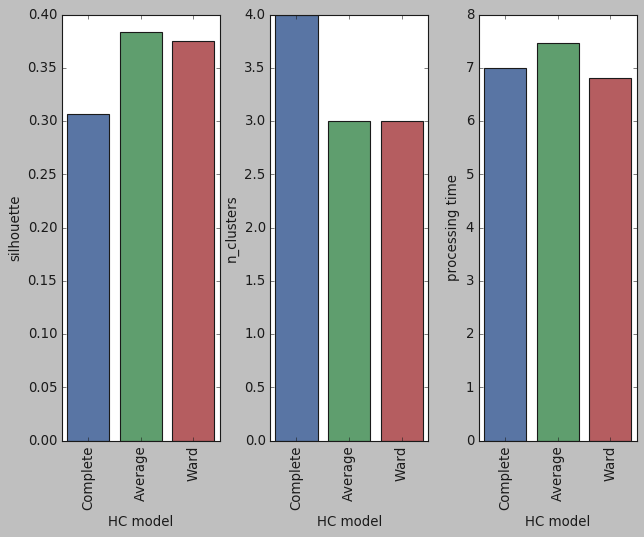

<Figure size 960x480 with 0 Axes>

In [73]:
# plot metrics across models for comparison of hierarchical clusters

from pylab import rcParams
%matplotlib inline
sns.set_palette("husl")
plt.style.use('classic')

fig, axs = plt.subplots(ncols=3)
fig.tight_layout()

_=plt.figure(figsize=(12, 6))

_=plt.setp(axs[0].xaxis.get_majorticklabels(), rotation = 90 )
_=plt.setp(axs[1].xaxis.get_majorticklabels(), rotation = 90 )
_=plt.setp(axs[2].xaxis.get_majorticklabels(), rotation = 90 )

_=sns.barplot(x = 'HC model', y = 'silhouette', data = HC_table, ax = axs[0])
_=sns.barplot(x = 'HC model', y = 'ç', data = HC_table, ax = axs[1])
_=sns.barplot(x = 'HC model', y = 'processing time', data = HC_table, ax = axs[2])

_=plt.show()

<a id='ModelandEvaluation3'></a>
### Section 3.3 -  Model and Evaluation 3  - Visualize Results (10 points)

[Back to top](#BacktoTop)

#### This section includes:

    3.3.1 - Join the feature dataset to the cluster identification regions from the k-means analysis 
    3.3.2 - Summary table for relative difference of each feature within each cluster
    3.3.3 - Plots across clusters for each feature: feature distribution, feature boxplots, cluster color map
    3.3.4 - Boxplot for cluster in feature participation
    3.3.5 - Plot for cluster with sorted relative feature participation
    3.3.6 - Check each cluster with sorted relative feature participation

K-Means Clustering has been identified as the best model with silhouette value (0.46) which is a measure of how similar an object is to its own cluster (cohesion) compared to other clusters (separation). The silhouette ranges from −1 to +1, where a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters.

As shown in Section [3.2.2.2 K-Means clustering via t-SNE](#tSNEDR),  we optimized the algorithm parameters with n_clusters = 15 and the silhouette value is 0.46 (other parameters: algorithm='auto', init='k-means++', max_iter=300, n_init=10, precompute_distances='auto',random_state=1, tol=0.0001, verbose=0).

To evaluate the resulting clusters for each of the k-value = 15 clusters, we combine the feature data set to the cluster identification regions from the k-means analysis for comparison of the features with the mapped cluster labels, and use Spectrum map (left), Box-Plot (center) and Feature distribution (right) for displaying the magnitude and distributions of the original features relative to the cluster labels in t-SNE space. 

These three plots for each feature are shown together for better visualization. 

(1) Spectrum Map is to demonstrate the features in t-SNE space with the scaled color to show the magnitude of each point of the feature in that space.

(2) Box-Plot is to use box and whisker plot to find the associated clusters. 

(3) Feature distribution represents the differentiated t-SNE space as by colored individually

For example: num_keywords associate all 9 clusters, while cluster 1 is only highly associated to LDA_02 and Weekdays (Tuesday / Wednesday).

For better understanding these spectrum map, we will visualize the feature importance with two plots and summarize how each feature is distributed under each cluster in details.

##### 3.3.1 Join the feature dataset to the cluster identification regions from the k-means analysis 

In [41]:
len(kmeans_labels)

X_all_together = copy.deepcopy(df_join)
len(X_all_together)
X_all_together['kmeans_labels'] = kmeans_labels
X_all_together.describe().T.head()

11893

11893

,count,mean,std,min,25%,50%,75%,max
x-tsne,11893.0,-0.024313,4.489026,-8.771065,-3.666459,0.002644,3.565357,9.009777
y-tsne,11893.0,0.020710,4.678900,-8.967864,-3.865202,0.204198,3.854493,9.869983
sample_index,11893.0,19863.457832,11479.229059,0.000000,9783.000000,19883.000000,29858.000000,39643.000000
num_keywords,11893.0,-0.003314,1.002087,-3.972899,-0.661657,-0.188622,0.757447,4.068690
data_channel_is_lifestyle,11893.0,-0.002478,0.996971,-3.260042,-0.641015,-0.117210,0.930401,1.454206


##### 3.3.2. Summary table for relative difference of each feature within each cluster

In [42]:
# summary table for relative difference of each feature within each cluster
X_cluster_analysis = copy.deepcopy(X_all_together)
del X_cluster_analysis['x-tsne']
del X_cluster_analysis['y-tsne']
del X_cluster_analysis['sample_index']

grouped = X_cluster_analysis.groupby(['kmeans_labels'])

cluster_analysis_table = (grouped.mean() - X_cluster_analysis.mean()) / X_cluster_analysis.std()

cluster_analysis_table.head()

,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04,abs_title_sentiment_polarity,abs_title_subjectivity,data_channel_is_entertainment,data_channel_is_lifestyle,data_channel_is_socmed,...,num_keywords,popular,rate_negative_words,rate_positive_words,title_sentiment_polarity,weekday_is_friday,weekday_is_monday,weekday_is_thursday,weekday_is_tuesday,weekday_is_wednesday
kmeans_labels,,,,,,,,,,,,,,,,,,,,,
0,-0.390969,0.188167,-0.338584,0.349393,-0.528084,0.067299,-0.028873,-0.232908,0.008204,-0.452003,...,-0.031675,-0.105434,0.155821,-0.024965,0.027967,2.097768,-0.102137,-0.48130,-0.441882,-0.483154
1,-0.390969,0.198803,0.447321,-0.397463,0.412044,-0.060819,0.001704,-0.232908,-0.209641,0.670070,...,0.125707,0.304827,0.053433,0.064187,-0.117109,-0.476657,0.328628,-0.48130,2.262856,-0.483154
2,-0.390969,-0.008311,-0.276418,0.206536,-0.071992,0.028991,-0.058156,-0.232908,0.075848,-0.397166,...,-0.049407,0.015778,0.076219,0.000493,0.096783,-0.476657,0.046199,-0.48130,-0.441882,-0.483154
3,2.557535,0.236476,-0.385152,0.402995,-0.504658,0.212328,-0.170206,-0.232908,0.192050,-0.457438,...,0.064410,-0.045915,0.073984,-0.005111,0.076293,-0.476657,-0.172254,-0.48130,-0.441882,-0.483154
4,-0.390969,0.215793,-0.341684,0.308632,-0.546652,0.043935,-0.023028,-0.232908,-0.023437,-0.456341,...,-0.002657,-0.028479,0.190819,-0.006265,0.089202,-0.476657,-0.083755,2.07753,-0.441882,-0.483154


##### 3.3.3. Plots across clusters for each feature: feature distribution color map, feature boxplots, cluster color map

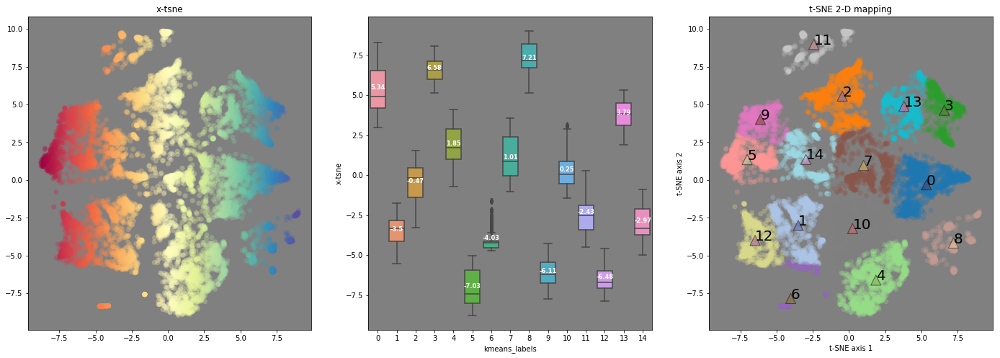

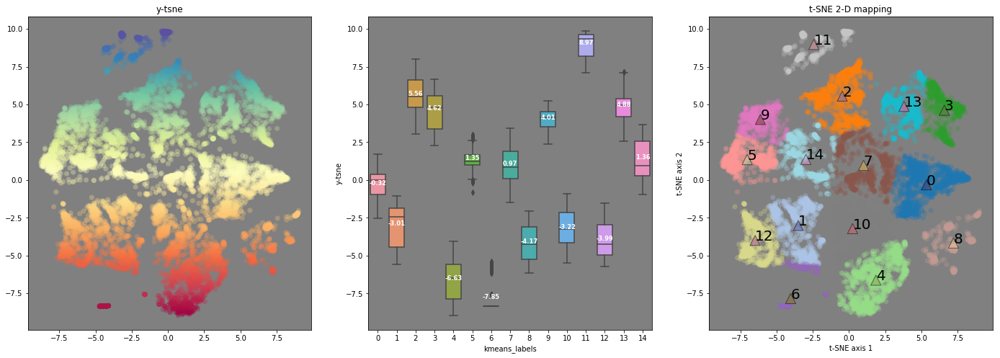

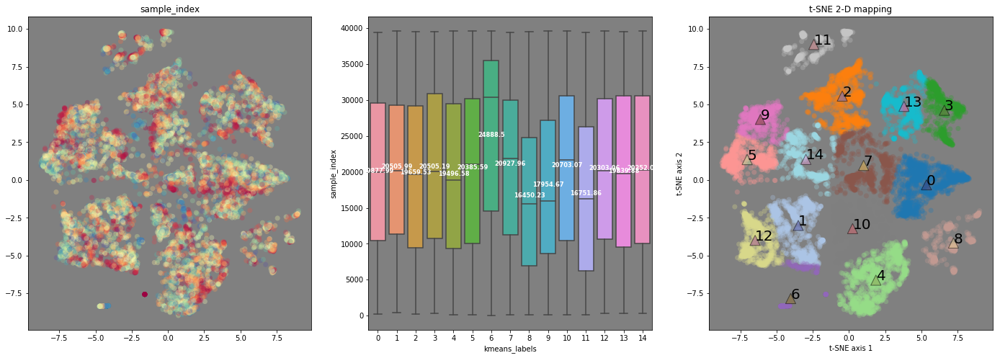

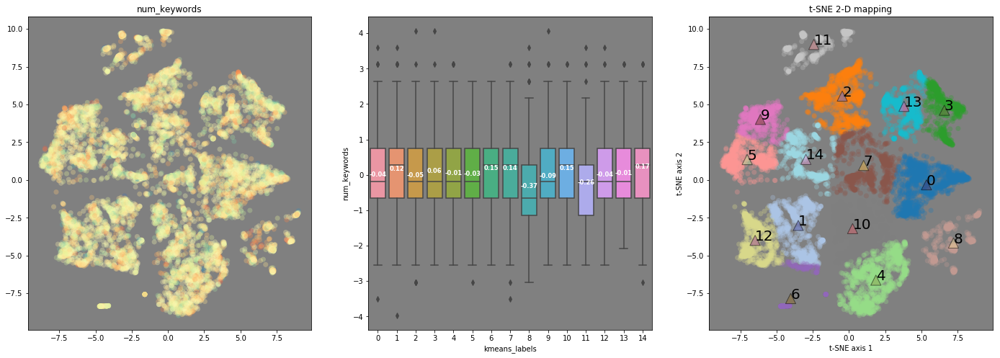

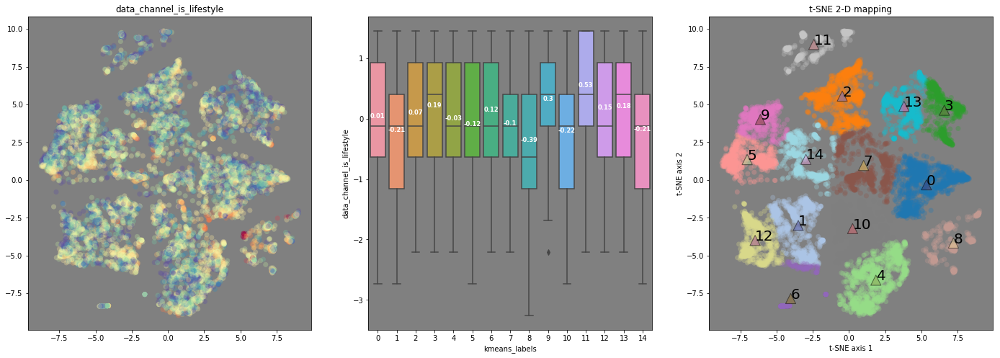

...

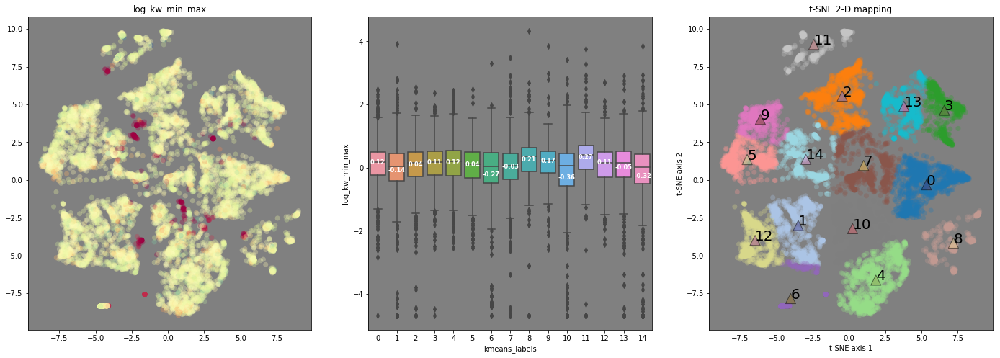

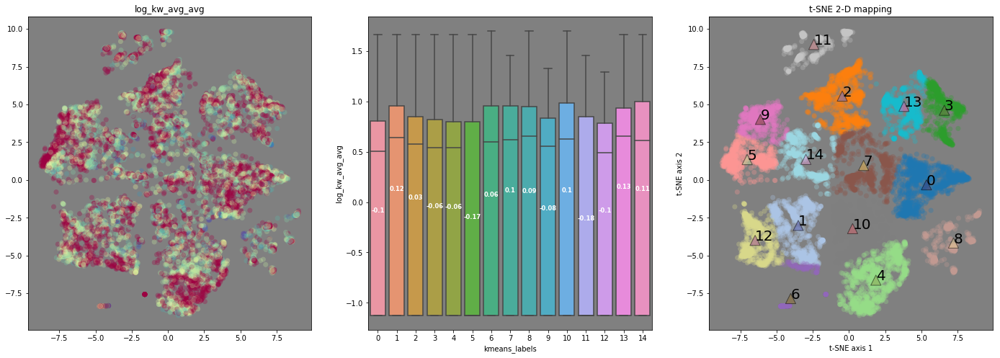

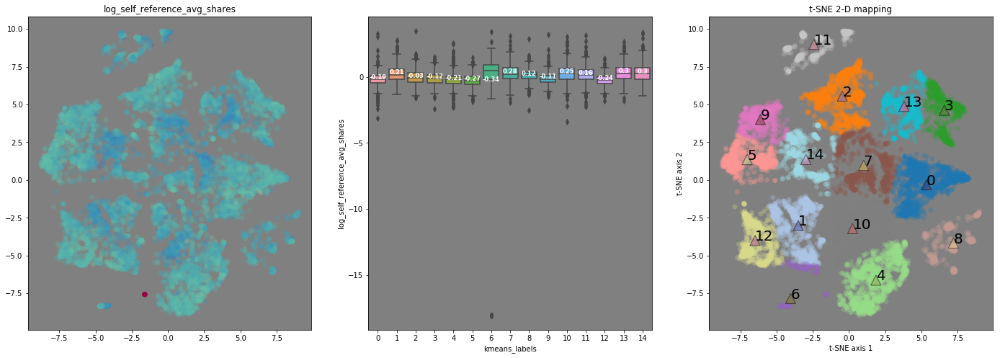

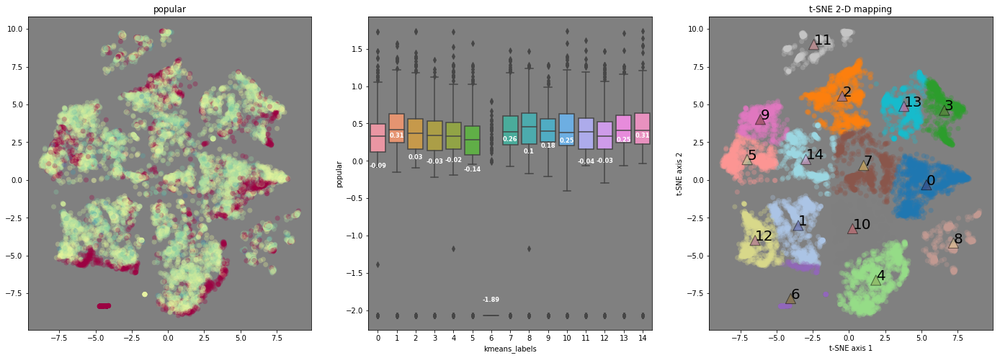

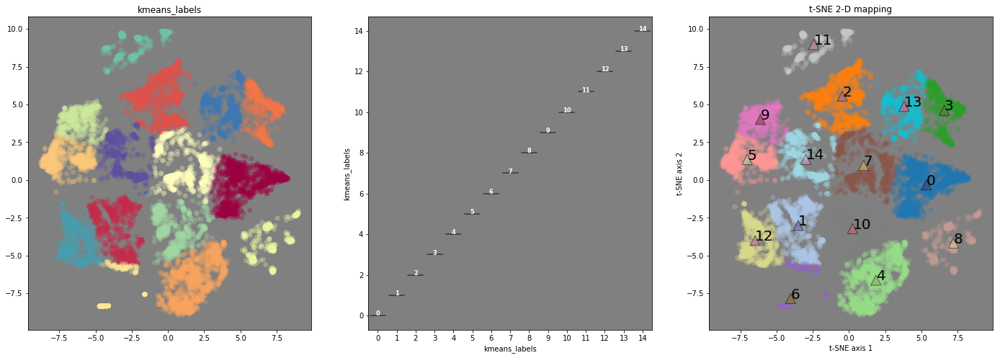

In [43]:
import seaborn as sns

# plots across clusters for each feature
col_names = X_all_together.columns.values.tolist()

for col in col_names :
    
    _ = plt.figure(figsize=(24, 8));
    
# feature distribution color map 
    _ = plt.subplot(131, facecolor = 'grey');    
    _ = plt.scatter(X_all_together['x-tsne'], X_all_together['y-tsne'], c = X_all_together[col],
                    cmap = plt.cm.Spectral, s = 50, linewidths = 0, alpha = 0.30)
    _ = plt.title(col)
    
# feature boxplots
    _ = plt.subplot(132, facecolor = 'grey');
    ax = sns.boxplot(x = "kmeans_labels", y = col, data = X_all_together);    
    
    average_values = X_all_together.groupby(['kmeans_labels'])[col].mean().values
    average_labels = [str(np.round(s, 2)) for s in average_values]

    pos = range(len(average_values))
    
    for tick, label in zip(pos, ax.get_xticklabels()):        
        _ = ax.text(pos[tick], average_values[tick], average_labels[tick],
                    horizontalalignment = 'center', size = 'small', color = 'w', weight = 'semibold')

# cluster color map    
    _ = plt.subplot(133, facecolor = 'grey');    
    _ = plt.scatter(X_all_together['x-tsne'], X_all_together['y-tsne'], c = kmeans_labels, cmap = plt.cm.tab20,
                    s = 50, linewidths = 0, alpha = 0.30)
    _ = plt.scatter(kmeans_centers[:, 0], kmeans_centers[:, 1], c = range(n_clusters), cmap = plt.cm.tab20b,
                    s = 200, linewidths = 1.0, marker = '^', edgecolors = 'black', alpha = 0.50);  
    
    for ii in range(n_clusters) :
        _ = plt.text(kmeans_centers[ii, 0], kmeans_centers[ii, 1], ii, fontsize = 20)
        _ = plt.xlabel('t-SNE axis 1')
        _ = plt.ylabel('t-SNE axis 2')
        _ = plt.title('t-SNE 2-D mapping')  
   
    _ = plt.show();
    

##### 3.3.4. Boxplot for cluster in feature participation

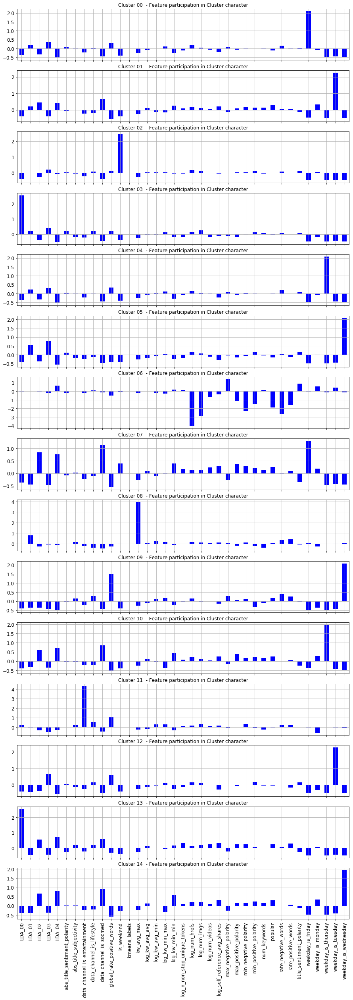

In [44]:
# cluster for feature participation

_ = plt.figure(figsize=(15, 45));

plot_rows = int(n_optimal_clusters+1)

for ii in range(n_optimal_clusters) :
    
    ax = plt.subplot(plot_rows, 1, ii+1, facecolor = 'white');
    
    if ii < n_optimal_clusters-1 : 
        weight = pd.Series(cluster_analysis_table.loc[ii])
        
    else :
        weight = pd.Series(cluster_analysis_table.loc[ii], index = cluster_analysis_table.columns)        
    _ = weight.plot(kind = 'bar', fontsize = 12, color = 'blue')    
    _ = plt.grid(True)    
    
    if ii < n_optimal_clusters-1:
        _ = ax.xaxis.set_ticklabels([])    
    _ = plt.title("Cluster %02d  - Feature participation in Cluster character" %ii)
    
plt.show()

##### 3.3.5. Plot for cluster with sorted relative feature participation

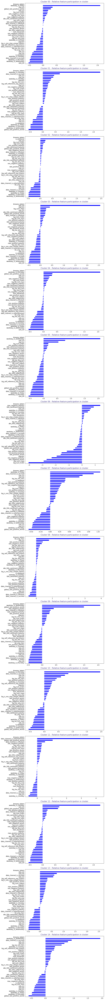

In [45]:
# cluster with sorted relative feature participation
_ = plt.figure(figsize=(12, 120));

plot_rows = int(n_optimal_clusters + 1)

for ii in range(n_optimal_clusters) :
    
    ax = plt.subplot(plot_rows, 1, ii+1, facecolor = 'white');
    
    weight = pd.Series(cluster_analysis_table.loc[ii],
                    index = cluster_analysis_table.columns).sort_values(ascending = True)
        
    _ = weight.plot(kind = 'barh', fontsize = 12, color = 'blue')
    
    _ = plt.title("Cluster %02d - Relative feature participation in cluster" %ii, fontsize = 15, 
                  color = 'darkslateblue')
    
    _ = plt.tight_layout()
    
plt.show()

#####  3.3.6. Check each cluster with sorted relative feature participation

In [ ]:
# write and save the cluster analysis table to csv file
# cs_table = cluster_analysis_table.T
# cs_table
# df.to_csv('/Users/shanqinggu/Desktop/tSNE_files/lab3/cs_table.csv')

In [46]:
# cluster_analysis_tbl.T
cluster_analysis_table.iloc[0].sort_values(ascending = False) # can shift .iloc[] to select cluster number

weekday_is_friday                2.097768
LDA_03                           0.349393
global_rate_positive_words       0.289508
LDA_01                           0.188167
log_num_hrefs                    0.168477
rate_negative_words              0.155821
log_kw_min_max                   0.113848
max_negative_polarity            0.070694
abs_title_sentiment_polarity     0.067299
log_num_imgs                     0.045734
title_sentiment_polarity         0.027967
data_channel_is_lifestyle        0.008204
min_positive_polarity            0.006394
log_kw_avg_min                   0.000056
rate_positive_words             -0.024965
abs_title_subjectivity          -0.028873
num_keywords                    -0.031675
min_negative_polarity           -0.058920
max_positive_polarity           -0.063859
log_num_videos                  -0.069898
log_kw_avg_avg                  -0.100008
weekday_is_monday               -0.102137
popular                         -0.105434
log_n_non_stop_unique_tokens    -0

<a id='ModelandEvaluation4'></a>
### Section 3.4 -  Model and Evaluation 4 - Summarize the Ramifications (20 points)

[Back to top](#BacktoTop)

Summarize the Ramifications

#### This section includes:

    3.4.1 - K-Means clustering summary
         3.4.1.1 LDA
         3.4.1.2 Day of the week
         3.4.1.3 Data Channel
         3.4.1.4 Digital Media
         3.4.1.5 Number of keywords
    3.4.2 - Summary of other clustering models ( Spectral clustering and hierarchical clustering)
    3.4.3 - Limitations for three clustering models
    3.4.4 - Future improvement

#### 3.4.1 K-Means clustering summary

As discussed in [Section 3.3 Visualize Results](#ModelandEvaluation3), we have identified that K-Means Clustering is the best and simplest approach to clustering with silhouette value (0.46) with the optimized algorithm parameters are listed in [Section 3.2.2.2 K-Means clustering via t-SNE](#tSNEDR). Here, we would like to understand how features are clustered to some specific patterns and summarize what we have observed from Spectrum Map, Box-Plot and Feature distributions.

From the listed values in cluster_analysis_table, we can identify if there are consistent patterns after checking the relative positive and negative participation of the features in the clusters. There are several attributes which are important for our cluster model applications related to online news popularity analysis.  

##### 3.4.1.1 LDA 

There are 5 measures of LDA (LDA_00, LDA_01, LDA_02, LDA_03, LDA_04). LDA (in this context) refers to a method by which a body of text can be scored relative to a vocabulary set that is identified with specific topics. 

Almost all clusters are associated with one of the 5 LDA measures. One specific measure may be associated to several clusters (e.g. LDA_01 +>> clusters 5, 8 ... and  ->>clusters 7, 9, ...), and one cluster may also be associated with several LDA measures (e.g. cluster 1 ++> LDA_02, LDA_04 and ->> LDA_01, LDA_03).

This is consistent with our previous statistical analysis works (Lab 1, minLab and Lab2) that LDA measures are playing crucial roles for online news popularity.

From this clustering analysis, we have the opportunity to think how to group some attributes together and reorganize the data for further analysis. 

##### 3.4.1.2 Day of the week

The Weekday attribute was one of the obviously important features in this study. There are more articles published during weekdays than in weekend. In this clustering analysis, it seems there are patterns in groups (Monday/Tuesday,  Wednesday, Thursday/Friday, Weekend). The online news popularity is Wednesday behaves differently compared with other days. Fro example, the online news popularity goes to different directions between Wednesday and Thurday for some clusters (e.g. in clusters 5, 10, 12). This pattern seems to reflect the productivity of workers which are helpful for resource and manpower planning. 

##### 3.4.1.3  Data Channel

There are 3 of 6 data channels (selected: entertainment, lifestyle, socmed; not selected: business, technology, world ) are selected for clustering analysis in this assignment. We noticed that the lifestyle category has the lowest number of articles published for this dataset while the World category has the highest number. As discussed in [Data Understanding 2.2.6](#DataUnderstanding2), the World channel has the most articles published and has the largest number of unpopular articles. Interestingly, the Tech, Socmedia, and Lifestyle channels have higher proportions of popular articles. From our clustering analysis above, entertainment and socmed channels are mostly marked in opposite directions in most clusters, while lifestyle is immune to this trend and contribute lightly in all the clustering methods.

##### 3.4.1.4  Digital Media

When checking the cluster distribution for the number of images (*num_imgs*) and videos (*num_videos*) per article, we noticed that these two items are associated with all clusters and linking each other either inter-cluster or cross-cluster. This indicate the images and video are equally important for online news popularity. 

##### 3.4.1.5. Number of keywords

When checking the number of keywords in an article, we found there are less contribution for the characteristics of all clusters. Therefore, the number of keywords is less important than the contents of keywords.

#### 3.4.2 Summary of other clustering models ( Spectral clustering and hierarchical clustering)

**Spectral clustering is similar to the above summary regarding characterization of K-Means clustering**

Clustering is a process of organizing objects into groups whose members are similar in some way. For Spectral clustering, data points as nodes of a connected graph and clusters are found by partitioning this graph, based on its spectral decomposition, into subgraphs. Comparatively, K-means clustering divides the objects into k clusters such that some metric relative to the centroids of the clusters is minimized.

We followed the similar computation algorithm and got the similar conclusions. However, we have to notice that the silhouette value for Spectral clustering is slightly lower than the silhouette value for K-Means clustering.

**hierarchical clustering results are dependent on linkage selections**  

There are four linkages (complete, average, ward and single) linkage for hierarchical agglomerative clustering with the basic idea to repeatedly merge two most similar groups as measured by the linkage. We checked each of the hierarchical models and compare the behavior of features under each type. 

Unfortunately, hierarchical clustering cannot get similar silhouette values due to less cluster numbers (n_optimal_cluster_complete = 4, n_optimal_cluster_average = 3, n_optimal_cluster_ward = 3). 


#### 3.4.3. Limitations for three clustering models

    **k-Means clustering**: 

      Difficult to predict the number of clusters (k)
      Cannot handle non-globular data of different sizes and densities
      Cannot identify outliers
      Restricted to data which has the notion of a center (centroid)

    **Spectral Clustering**

      May be sensitive to the options of parameters
      Computationally expensive for large datasets

    **Hierarchical Clustering**
    
      May have imbalanced clusters
      Have to choose number of clusters or threshold
      Once the instances have been assigned to a cluster, they can no longer be moved around.
      Time complexity: not suitable for large datasets
      Very sensitive to outliers


#### 3.4.4. Future improvement

In the future, we will optimize the dimensionality reduction methods and compare more clustering methods. 

K-means is one of the simplest approaches to clustering that clustering is an unsupervised problem. However, we still need combine other cluster validation criteria for clustering method evaluation.

Use external criteria for clustering quality control (purity, F-measure, Rand Index, average entropy).

<a id='Development'></a>
### Section 4 -  Deployment (10 points)

Be critical of your performance and tell the reader how you current model might be usable by other parties. Did you achieve your goals? If not, can you reign in the utility of your modeling? How useful is your model for interested parties (i.e., the companies or organizations that might want to use it)? How would your deploy your model for interested parties? What other data should be collected? How often would the model need to be updated, etc.?

[Back to top](#BacktoTop)

#### This section includes:

    4.1 - Be critical and tell how your current model might be usable by other parties.
    4.2 - Did you achieve your goals? If not, can you reign in the utility of your modeling?
    4.3 - How useful is your model for interested parties?
    4.4 - How would you deploy your model for interested parties?
    4.5 - What other data should be collected?
    4.6 - How often would the model need to be updated, etc.?
     

#### 4.1. Be critical and tell how your current model might be usable by other parties.

Interested parties for our clustering model include, publishers and writers. Publishers can benefit from the clustering models by using it to determine the advertisement pricing to apply to articles, if they can predict that the article will be popular, they could charge higher rates for those articles. Writers can use the clustering models in a similar way. If a writer were able to determine if their article will be popular before it gets published, they could us that to negotiate higher rates for publishers to be able to publish their articles.

For this purpose, we have reached our main objectives for this project. In the long run, we will investigate more methods to provide even better characterization of relevant clusters and features as identified here.

    **t-SNE is a good tool to explore for dimensionality reduction and visualization**

The t-SNE algorithm is a nonlinear dimensionality reduction technique in sklearn to visualize and understand high-dimensional data, by reducing the dimensional space of 2 or 3 dimensions so that it can be plotted easily and preserve local similarities.

t-SNE can be inefficient for large data (long computation time) and certainly not a good idea unless the data is strongly non-linear since this technique does not preserve distances nor density. Sometimes they just work well for visualization but not for dimensionality reduction.

However, we recognize that there are opportunities for exploration that may produce measurable improvements if pursued.

    **PCA can be used for dimensionality reduction but not for visualization

PCA is a widely used statistical technique for unsupervised dimension reduction. It is very efficient and tends to perform quite well for most data sets.

However, it is not working well when the data is strongly non-linear. It is also difficult to interpret, and the results are not always the best for visualization. In addition, PCA strongly focused in variance, sometimes there’s not a direct relationship between variance and predictive power so it can discard useful information.

    **Is it possible to combine PCA and t-SNE for dimensionality reduction?

It is a very interesting and challenging question so far. We tried to put together these two techniques and our preliminary results showed very encouraging results. We are planning to pursue in the future projects.

    **K-Means is easy to implement, but sensitive to scales**

K-Means clustering method is easy to implement, computationally fast with a large number of variables, produce tighter clusters than hierarchical clustering. The disadvantage is that it is difficult to predict the number of clusters (K-Value).

The K-Means cluster analysis we used in this project via t-SNE mapping provide the best results in clustering.  

    **Spectral clustering performs nearly the same as K-Means** 

Spectral clustering techniques make use of the spectrum (eigenvalues) of the similarity matrix of the data to perform dimensionality reduction before clustering in fewer dimensions. The similar results between K-Means and Spectral clustering may be due to t-SNE mapped vectors. 

Spectral clustering does not make strong assumptions on the statistics of the clusters, is easy to implement and achieve good clustering results. However, it may be sensitive to the options of parameters and computationally  expensive for large datasets.

    **Hierarchical clustering is easy to decide on the number of clusters**

Hierarchical clustering as deployed in this project resulted in less than 6 clusters in the whole domain. Its clustering output is very informative and easy to implement. This method does not perform well with all 3 linkages (complete, average and ward). 

#### 4.2. Did you achieve your goals? If not, can you reign in the utility of your modeling?

The model’s success can be measured by reviewing how well it performs in predicting whether or not articles will be popular for the interested parties.

Our K-Means clustering model has addressed several concerned questions related to LDA, Day of the week, Data Channel, Digital Media and Number of keywords. This part of work should work together with our previous studies, such as classification and regression analysis. We are confident that publishes would consider it a success if they were able to use it to increase their advertising revenue, and writers would consider it a success if were able to increase the rates they charged by using the model to help them write articles that will be shared more often and be more popular.

#### 4.3. How useful is your model for interested parties (i.e.,the companies or organizations that might want to use it)?

Interested parties for our model include, publishers and writers. Publishers can benefit from the model by using it to determine the advertisement pricing to apply to articles, if they can predict that the article will be popular they could charge higher rates for those articles. Writers can use the model in a similar way. If a writer were able to determine if their article will be popular before it gets published they could us that to negotiate higher rates for publishers to be able to publish their articles.

#### 4.4. How would you deploy your model for interested parties?

The model’s success can be measured by reviewing how well it performs in predicting whether or not articles will be popular for the interested parties. We will communicate with the editors to review this report and clarify some ambiguous questions such as the LDAs. The editors and their stuffs can use the selected models to monitor how the contents be well address to influence more readers.

This model would best be deployed through a web portal where various variables could be used when running Random Forest model; Knowing the data will be very important to deploy this model. Experienced users or well-trained data analysts should be the ones to run the model as they will have the knowledge to change variables as needed.
   
#### 4.5. What other data should be collected?

We would recommend collecting the following additional data:

(1). Amounts of shares at time intervals (1 day, 7 days, 30 days)

This data would be important to capture so that publishers can tell how long quickly articles are gaining traction and could use them to make better advertising pricing policies and have benchmarks to ensure they are charging the appropriate price for the popularity of their article.

(2). Amount of share per platform

This would be important to capture so writers and publisher could understand where their articles are being shared and optimize the content of the articles for the platforms where it is being shared the most, or change it to encourage more sharing on platforms where it wasn’t being frequently shared. 

#### 4.6. How often would the model need to be updated, etc.?

The model would need to be updated as new data is obtained to keep up with the changing social media landscape. This model should be also modified based on the news influence durability and survivability, evaluated regularly in order to meet reader's changing needs. As social media platforms continue their climb as the most common way for information to be published and distributed, the benchmark for number of share it requires to be classified as popular will need to be updated to keep up with the norms as they are recalculated. We would recommend recalculating the benchmarks on at least quarterly basis. 

<a id='ExceptionalWork'></a>
### Section 5 -  Exceptional Work (10 points)
You have free reign to provide additional analyses or combine analyses.
[Back to top](#BacktoTop)

#### This section includes:

    5.1 - Implement two dimensionality reduction techniques: t-SNE and PCA
    5.2 - Combine t-SNE and PCA for dimensionality reduction
      5.2.1 - Get the minimum features to explain 90% of the varainces in PCA
      5.2.2 - Continue with t-SNE and K-Means clustering after PCA (n_components=20 )
      5.2.3 - Continue with K-Means clustering after PCA and t-SNE dimensionality reduction

<a id='ExceptionalWork51'></a>
#### 5.1 - Implement two dimensionality reduction techniques: t-SNE and PCA

PCA is a unsupervised and linear mathematical technique for reducing the number of dimensions in a dataset while retaining most information, and t-SNE is a nonlinear and probabilistic  technique for dimensionality reduction and is particularly well suited for the visualization of high-dimensional datasets. 

**We have implemented 2D reduction techniques (PCA and t-SNE) for this project as discussed above.** 

[Back to top](#BacktoTop)

<a id='ExceptionalWork52'></a>
#### 5.2 - Combine t-SNE and PCA for dimensionality reduction

PCA is the linear dimensionality reduction technique using **Singular Value Decomposition** of the data to project it to a lower dimensional space. PCA is often used to reduce dimensionality, but it might not be the best method as it is a linear and parametric method.

In [Section 3.2.2.1](#PCADR) (**K-Means clustering via PCA**), we combine PCA and K-Means clustering techniques and the ***Silhouette Coefficients*** for initiation ('init') with k-means is 0.354, 'random' is 0.061 and 'PCA-based' is 0.055. The poor performance of PCA is considered as there are not enough selected components. In this section, we extend this part of work by gathering PCA and t-SNE into one dimensionality reduction method.

The first step employed is dimensionality reduction using PCA to recover most of the essential characteristics of the data which can explain 80% of the variance. As seen in the graph below, approximately 20 features can help explain 90% variance in the data. Hence, our final data that is fed into t-SNE and K-Means clustering procedures has 39644 observations and 20 features/attributes.

The data sources transformed with PCA and with t-SNE. In light of the good separation, we should repeat here that both methods are unsupervised, that is, neither methods received labels and the colors were added after transformation.

PCA's main weakness is that it tends to be highly affected by outliers in the data. For this reason, many robust variants of PCA have been developed, many of which act to iteratively discard data points that are poorly described by the initial components. Scikit-Learn contains a couple interesting variants on PCA, including RandomizedPCA and SparsePCA in the sklearn.decomposition submodule. RandomizedPCA uses a non-deterministic method to quickly approximate the first few principal components in very high-dimensional data, while SparsePCA introduces a regularization term that serves to enforce sparsity of the components. We will try these two approaches in the future.

[Back to top](#BacktoTop)

#### 5.2.1 Get the minimum features to explain 80% of the varaince in PCA

In [47]:
# prepare and normalize the data
from sklearn.preprocessing import StandardScaler

df_pca_e = df.copy()
scaler = StandardScaler()

Xe = df_pca_e.drop('popular',axis=1)
ye = df_pca_e['popular']

Xe = scaler.fit_transform(Xe)

In [48]:
# dataframe data with pandas
df_pca_e = pd.DataFrame(data=Xe, columns=df_pca_e.columns[1:])
df_pca_e.describe()

,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,weekday_is_friday,...,log_n_non_stop_unique_tokens,log_num_hrefs,log_num_imgs,log_num_videos,log_kw_min_min,log_kw_avg_min,log_kw_min_max,log_kw_avg_avg,log_self_reference_avg_shares,popular
count,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,...,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04,3.964400e+04
mean,9.870760e-16,4.569434e-15,3.396464e-14,1.470213e-14,1.077641e-14,1.574005e-15,2.053876e-15,-7.161420e-16,-3.323769e-15,-6.761567e-16,...,3.228199e-16,-1.870453e-15,-6.539859e-15,1.278536e-14,2.491716e-14,9.437353e-14,-4.050057e-16,-3.856306e-14,-1.976668e-15,6.477463e-15
std,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,...,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00
min,-3.972899e+00,-3.260042e+00,-2.364450e-01,-4.653587e-01,-2.494870e-01,-1.919178e+00,-4.493913e-01,-4.786636e-01,-4.804541e-01,-4.737610e-01,...,-6.896581e-01,-5.313924e+00,-3.795880e+00,-1.663615e+00,-7.123649e-01,-6.776711e-01,-4.682076e+00,-1.127381e+00,-1.806715e+01,-2.068298e+00
25%,-6.616566e-01,-6.410154e-01,-2.364450e-01,-4.653587e-01,-2.494870e-01,-6.397832e-01,-4.493913e-01,-4.786636e-01,-4.804541e-01,-4.737610e-01,...,-6.896581e-01,-5.113835e-02,-4.801946e-01,-1.772306e-01,-7.123649e-01,-6.776711e-01,-2.950543e-01,-1.127381e+00,-3.437783e-01,1.543325e-01
50%,-1.886220e-01,-1.172101e-01,-2.364450e-01,-4.653587e-01,-2.494870e-01,-1.088798e-01,-4.493913e-01,-4.786636e-01,-4.804541e-01,-4.737610e-01,...,-6.896581e-01,1.757393e-01,1.277306e-01,-1.772306e-01,-7.123649e-01,-6.776711e-01,1.483142e-01,5.665152e-01,-1.633596e-02,3.495721e-01
75%,7.574472e-01,9.304005e-01,-2.364450e-01,-4.653587e-01,-2.494870e-01,5.307015e-01,-4.493913e-01,-4.786636e-01,-4.804541e-01,-4.737610e-01,...,4.151124e-01,3.829365e-01,6.226503e-01,6.383186e-01,8.721427e-01,3.562300e-01,5.131474e-01,8.735266e-01,3.822393e-01,5.575754e-01
max,5.960828e+00,1.454206e+00,4.229313e+00,2.148880e+00,4.008224e+00,4.322840e+00,2.225232e+00,2.089150e+00,2.081364e+00,2.110769e+00,...,3.729424e+00,1.799851e+01,3.364773e+00,2.771804e+00,3.790624e+00,2.748472e+00,4.735563e+00,1.702200e+00,4.766770e+00,1.788086e+00


In [49]:
# PCA fit
from sklearn.decomposition import PCA

t_pca = PCA(n_components=36)
t_pca36 = t_pca.fit(df_pca_e)

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Explained variance ratio of principal components\n')

Text(0.5, 0, 'Number of principal components')

([<matplotlib.axis.XTick at 0x1a26e0d518>,
 <a list of 36 Text xticklabel objects>)

(array([-0.02,  0.  ,  0.02,  0.04,  0.06,  0.08,  0.1 ,  0.12]),
 <a list of 8 Text yticklabel objects>)

Text(0, 0.5, 'Explained variance ratio')

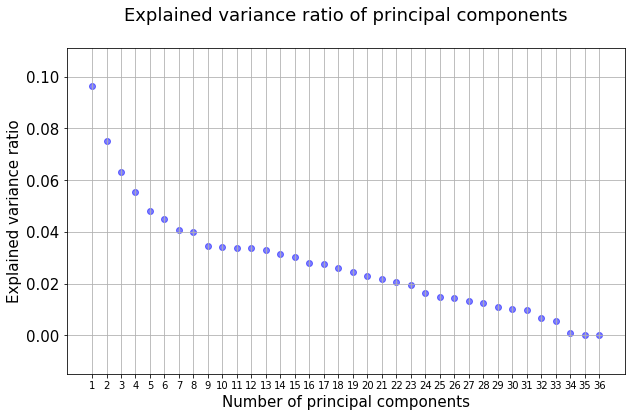

In [50]:
# plot the explained variance ratio of principal components
plt.figure(figsize=(10,6))
plt.scatter(x=[i+1 for i in range(len(t_pca36.explained_variance_ratio_))],
            y=t_pca36.explained_variance_ratio_, alpha=0.5, c='blue', edgecolor='face')
plt.grid(True)
plt.title("Explained variance ratio of principal components\n",fontsize=18)
plt.xlabel("Number of principal components", fontsize=15)
plt.xticks([i+1 for i in range(len(t_pca36.explained_variance_ratio_))],fontsize=10)
plt.yticks(fontsize=15)
plt.ylabel("Explained variance ratio",fontsize=15)
plt.show()

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Cumulative explained variance ratio of principal components\n')

Text(0.5, 0, 'Number of principal components')

([<matplotlib.axis.XTick at 0x1a2ea7d630>,
 <a list of 36 Text xticklabel objects>)

(array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2]),
 <a list of 7 Text yticklabel objects>)

Text(0, 0.5, 'Cumulative explained variance ratio')

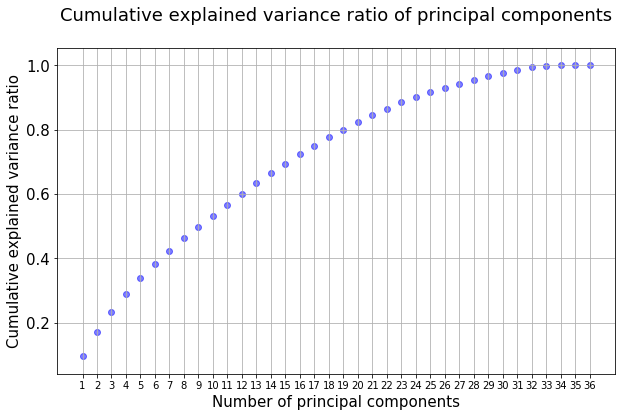

In [51]:
# plot the cumulative explained variance ratio of principal components
plt.figure(figsize=(10,6))
plt.scatter(x=[i+1 for i in range(len(t_pca36.explained_variance_ratio_))],
            y=np.cumsum(t_pca36.explained_variance_ratio_), alpha=0.5, c='blue', edgecolor='face')
plt.grid(True)
plt.title("Cumulative explained variance ratio of principal components\n",fontsize=18)
plt.xlabel("Number of principal components", fontsize=15)
plt.xticks([i+1 for i in range(len(t_pca36.explained_variance_ratio_))],fontsize=10)
plt.yticks(fontsize=15)
plt.ylabel("Cumulative explained variance ratio",fontsize=15)
plt.show()

In [52]:
# choose the minimum number of principal components such that 90% of the variance is retained 
pca9 = PCA(0.90) 
pca9_result = pca9.fit_transform(df_pca_e.values)

print ('Explained variation PCA:\n {} \n'.format(pca9.explained_variance_))
print ('Explained variance per principal component:\n {} \n'.format(pca9.explained_variance_ratio_))
print ('Explained variance ratio cumulative sum: \n {} \n'.format(pca9.explained_variance_ratio_.cumsum()))

Explained variation PCA:
 [3.46873786 2.7029722  2.26867478 1.99975659 1.73523237 1.62165726
 1.46866257 1.43979951 1.24392548 1.23111341 1.21279502 1.21004932
 1.18189042 1.13819053 1.09520077 1.01150449 0.98524356 0.93177192
 0.87935746 0.83042978 0.77698986 0.7361144  0.69442655 0.58243435] 

Explained variance per principal component:
 [0.0963514  0.07508067 0.06301715 0.05554739 0.04819968 0.0450449
 0.04079515 0.03999342 0.03455261 0.03419673 0.0336879  0.03361163
 0.03282946 0.03161561 0.03042148 0.02809664 0.02736719 0.0258819
 0.02442598 0.02306691 0.02158251 0.02044711 0.01928914 0.01617832] 

Explained variance ratio cumulative sum: 
 [0.0963514  0.17143207 0.23444922 0.28999661 0.3381963  0.3832412
 0.42403635 0.46402977 0.49858238 0.53277912 0.56646702 0.60007865
 0.63290811 0.66452372 0.69494519 0.72304183 0.75040902 0.77629092
 0.8007169  0.82378381 0.84536632 0.86581342 0.88510256 0.90128089] 



#### 5.2.2 Continue with t-SNE after PCA ( n_components=20, t-SNE 2-D Mapping - Perplexity = 40, KL divergence after 500 iterations: 2.613737)

In [53]:
# prepare data
df_pt = df.copy()
Xpt = df_pt.drop('popular',axis=1)
Xpt_index = list(Xpt.index.values)
# Xpt = Xpt.sample(frac =0.25) # here we use the whole data instead of fractional data
len(Xpt_index)

39644

In [54]:
# performing PCA for 20 components
t_pca20 = PCA(n_components=20)
tf_pca20 = t_pca20.fit_transform(Xpt)
tf_pca20 = StandardScaler().fit_transform(tf_pca20)

In [55]:
import time
from sklearn.manifold import TSNE

# Running t-SNE with PCA outputs; generating 2 dimensional data points
print("Calculating t-SNE with PCA output (n_components = 2)")
tsne = TSNE(n_components=2, perplexity=50, verbose=2, n_iter=500, early_exaggeration=1)
tsne_fit = tsne.fit_transform(tf_pca20)
tsne_fit = StandardScaler().fit_transform(tsne_fit)

Calculating t-SNE with PCA output (n_components = 2)
[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 39644 samples in 0.050s...
[t-SNE] Computed neighbors for 39644 samples in 145.901s...
[t-SNE] Computed conditional probabilities for sample 1000 / 39644
[t-SNE] Computed conditional probabilities for sample 2000 / 39644
[t-SNE] Computed conditional probabilities for sample 3000 / 39644
[t-SNE] Computed conditional probabilities for sample 4000 / 39644
[t-SNE] Computed conditional probabilities for sample 5000 / 39644
[t-SNE] Computed conditional probabilities for sample 6000 / 39644
[t-SNE] Computed conditional probabilities for sample 7000 / 39644
[t-SNE] Computed conditional probabilities for sample 8000 / 39644
[t-SNE] Computed conditional probabilities for sample 9000 / 39644
[t-SNE] Computed conditional probabilities for sample 10000 / 39644
[t-SNE] Computed conditional probabilities for sample 11000 / 39644
[t-SNE] Computed conditional probabilities for sample 12000 / 

<Figure size 720x720 with 0 Axes>

Text(0.5, 0, 't-SNE axis 1')

Text(0, 0.5, 't-SNE axis 2')

Text(0.5, 0.98, 't-SNE 2-D Mapping - Perplexity = 40')

Text(0.5, 1.0, 'KL Divergence')

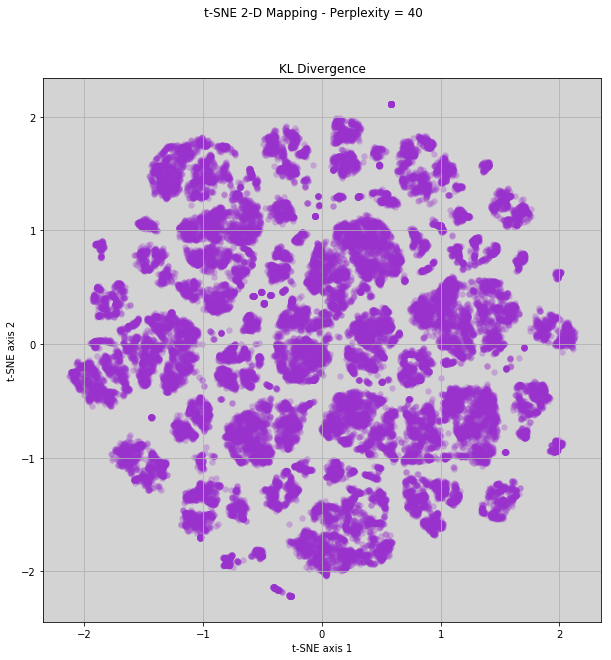

In [56]:
# plot clusters
plt.figure(figsize = (10, 10))
plt.subplot(111, facecolor = 'lightgrey')
plt.scatter(tsne_fit[:, 0], tsne_fit[:, 1], s = 40, c = 'darkorchid', linewidths = 0, alpha = 0.30)  
plt.xlabel('t-SNE axis 1')
plt.ylabel('t-SNE axis 2') 
plt.suptitle("t-SNE 2-D Mapping - Perplexity = 40")
plt.title("KL Divergence")
plt.grid(True)

#### 5.2.3 Continue with K-Means clustering after PCA and t-SNE dimensionality reduction (n_clusters =  14, silhouette =  0.3839)

In [57]:
# set required variables for model comparison
pt_kmeans_table = pd.DataFrame(columns = ['model_name', 'n_clusters', 'inertia', 'silhouette', 'process_time'])

i_index = []
i_index = 0

# each classifier is appended once model is fit
models = []

In [58]:
# select cluster range for K-means via t-SNE with initiation 'k-means++''
X_tsne = pd.DataFrame(columns=['t1', 't2'])
X_tsne['t1'] = tsne_fit[:, 0]
X_tsne['t2'] = tsne_fit[:, 1]

for n_clusters in range(5, 16): 
    
    tic = time.clock()
    
    print ("n_clusters = ", n_clusters)

    km_clusters = KMeans(n_clusters = n_clusters, init = 'k-means++', max_iter=300, tol=0.0001, random_state = 1);
    
    km_clusters.fit(X_tsne)

    kmeans_labels = km_clusters.labels_ # the labels from kmeans clustering
    kmeans_centers = km_clusters.cluster_centers_

    kmeans_inertia = km_clusters.inertia_
    print ("inertia = ", kmeans_inertia)
    
    kmeans_silhouette = mt.silhouette_score(X_tsne, kmeans_labels, metric = 'euclidean',sample_size = 10000)
    print ("silhouette = ", kmeans_silhouette)
    
    toc =  time.clock()

# save statistics for model comparison
    exe_time = '{0:.4f}'.format(toc-tic)
    
    raw_data = {'model_name' : 'KMeans - LDA features', 'n_clusters' : n_clusters, 'inertia': kmeans_inertia,
                'silhouette': kmeans_silhouette, 'process_time' : exe_time}

    df_tbl = pd.DataFrame(raw_data,
                          columns = ['model_name', 'n_clusters', 'inertia', 'silhouette', 'process_time'],
                          index = [i_index + 1])

    pt_kmeans_table = pt_kmeans_table.append(df_tbl, ignore_index=True)

n_clusters =  5


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  18199.134289869922
silhouette =  0.35360026
n_clusters =  6


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=6, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  14852.867488122263
silhouette =  0.38445818
n_clusters =  7


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=7, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  12263.647964763777
silhouette =  0.38398638
n_clusters =  8


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=8, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  10661.036969411416
silhouette =  0.37860647
n_clusters =  9


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=9, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  9545.28804822102
silhouette =  0.37560835
n_clusters =  10


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  8636.249696995297
silhouette =  0.37534404
n_clusters =  11


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=11, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  7883.034908328052
silhouette =  0.37064156
n_clusters =  12


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=12, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  7126.814833478109
silhouette =  0.3839123
n_clusters =  13


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=13, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  6597.197421516634
silhouette =  0.38074535
n_clusters =  14


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=14, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  6053.7946284322
silhouette =  0.38621935
n_clusters =  15


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=15, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  5579.353061996195
silhouette =  0.38542965


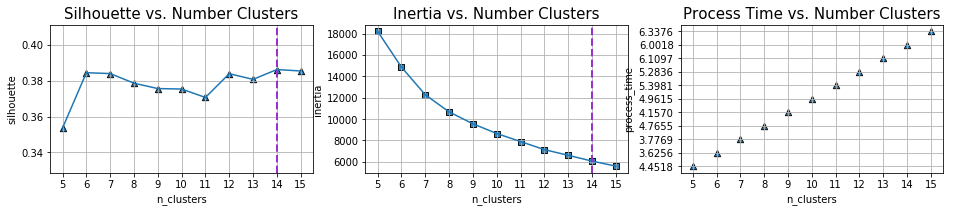

In [59]:
import math

# use max silhouette score to mark optimal c=number of clusters
n_optimal_clusters = pt_kmeans_table['silhouette'].idxmax() + pt_kmeans_table['n_clusters'].min()

# plot metrics across models for comparison
plt.figure(figsize=(16, 6));

# silhouette values
plt.subplot(231);
plt.scatter(pt_kmeans_table['n_clusters'],
            pt_kmeans_table['silhouette'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

plt.plot(pt_kmeans_table['n_clusters'],
         pt_kmeans_table['silhouette'])

plt.xlabel('n_clusters'), plt.ylabel('silhouette');
plt.title('Silhouette vs. Number Clusters', fontsize = 15)
plt.grid();

# set vertical line for at max silhouette value
plt.axvline(x = n_optimal_clusters, linewidth = 2, linestyle = 'dashed', color = 'darkorchid')

xint = range(min(pt_kmeans_table['n_clusters']), math.ceil(max(pt_kmeans_table['n_clusters']))+1)
plt.xticks(xint)

# inertia values
plt.subplot(232);
plt.scatter(pt_kmeans_table['n_clusters'], pt_kmeans_table['inertia'], s = 40, linewidths = 1.0, marker = ',',
            edgecolors = 'black', alpha = 0.90);

plt.plot(pt_kmeans_table['n_clusters'], pt_kmeans_table['inertia'])

plt.xlabel('n_clusters'), plt.ylabel('inertia');
plt.title('Inertia vs. Number Clusters', fontsize = 15)
plt.grid();

# set vertical line for at max silhouette value
plt.axvline(x = n_optimal_clusters, linewidth = 2, linestyle = 'dashed', color = 'darkorchid')

xint = range(min(pt_kmeans_table['n_clusters']), math.ceil(max(pt_kmeans_table['n_clusters']))+1)
plt.xticks(xint)

# plot with process time
plt.subplot(233);
plt.scatter(pt_kmeans_table['n_clusters'], pt_kmeans_table['process_time'], s = 40, linewidths = 1.0, marker = '^',
            edgecolors = 'black', alpha = 0.90);
plt.xlabel('n_clusters'), plt.ylabel('process_time');
plt.title('Process Time vs. Number Clusters', fontsize = 15)
plt.grid();

xint = range(min(pt_kmeans_table['n_clusters']), math.ceil(max(pt_kmeans_table['n_clusters']))+1)
plt.xticks(xint)

plt.show();

n_clusters =  14


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=14, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  6053.7946284322
silhouette =  0.38392237


<Figure size 864x864 with 0 Axes>

Text(1.3628583208098561, 0.2767895128907096, '0')

0 1.3628583208098561 0.2767895128907096 0


Text(0.03137574173161007, -1.5868749218984304, '1')

1 0.03137574173161007 -1.5868749218984304 1


Text(-1.128534781794845, 1.293351330569963, '2')

2 -1.128534781794845 1.293351330569963 2


Text(0.08688879187008855, 0.04515591600785686, '3')

3 0.08688879187008855 0.04515591600785686 3


Text(1.4508201505975225, -0.6308167250925604, '4')

4 1.4508201505975225 -0.6308167250925604 4


Text(-0.7609282763658731, 0.6382030930222843, '5')

5 -0.7609282763658731 0.6382030930222843 5


Text(1.0809974443925539, 1.2962298266808203, '6')

6 1.0809974443925539 1.2962298266808203 6


Text(1.0917954545354183, -1.3173031161172373, '7')

7 1.0917954545354183 -1.3173031161172373 7


Text(-1.5595093255097932, -0.06719437389388236, '8')

8 -1.5595093255097932 -0.06719437389388236 8


Text(-0.6005233620240249, -0.5741433123608826, '9')

9 -0.6005233620240249 -0.5741433123608826 9


Text(0.5107099502848542, -0.6357978330596978, '10')

10 0.5107099502848542 -0.6357978330596978 10


Text(-0.028714263821233238, 1.6246521534447054, '11')

11 -0.028714263821233238 1.6246521534447054 11


Text(0.26261298416607665, 0.7768775439746212, '12')

12 0.26261298416607665 0.7768775439746212 12


Text(-1.1599021439582848, -1.2388265663537175, '13')

13 -1.1599021439582848 -1.2388265663537175 13
[11 11 11 ...  0  6  9]
[[ 1.36285832  0.27678951]
 [ 0.03137574 -1.58687492]
 [-1.12853478  1.29335133]
 [ 0.08688879  0.04515592]
 [ 1.45082015 -0.63081673]
 [-0.76092828  0.63820309]
 [ 1.08099744  1.29622983]
 [ 1.09179545 -1.31730312]
 [-1.55950933 -0.06719437]
 [-0.60052336 -0.57414331]
 [ 0.51070995 -0.63579783]
 [-0.02871426  1.62465215]
 [ 0.26261298  0.77687754]
 [-1.15990214 -1.23882657]]


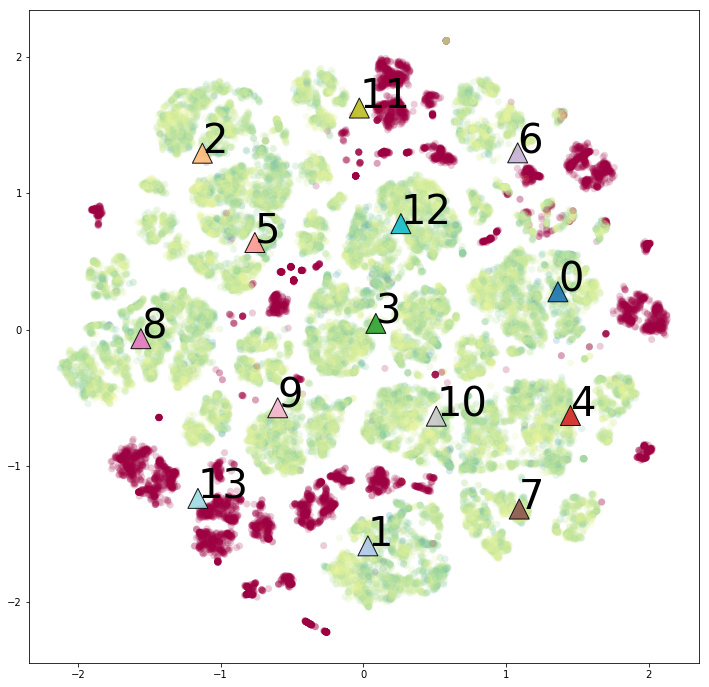

In [60]:
# optimal clusters with inertia and silhouette values and plot the clusters

n_clusters_chosen = n_optimal_clusters

for n_clusters in [n_clusters_chosen] :

    tic = time.clock()
    
    print ("n_clusters = ", n_clusters)

    km_clusters = KMeans(n_clusters = n_clusters, init = 'k-means++', random_state = 1);
    
    km_clusters.fit(X_tsne)
    
    kmeans_labels = km_clusters.labels_ 
    kmeans_centers = km_clusters.cluster_centers_

    kmeans_inertia = km_clusters.inertia_
    print ("inertia = ", kmeans_inertia)
    
    kmeans_silhouette = mt.silhouette_score(X_tsne, kmeans_labels, metric = 'euclidean', sample_size = 10000)
    print ("silhouette = ", kmeans_silhouette)
    
    toc =  time.clock()

# plot clusters    
    plt.figure(figsize=(12, 12));
    ax = plt.gca();
    
    X_tsne_values = X_tsne.values;
    plt.scatter(X_tsne_values[:, 0], X_tsne_values[:, 1], c = df_pca_e['popular'], cmap = plt.cm.Spectral, 
                s = 50, linewidths = 0, alpha = 0.20);
    plt.scatter(kmeans_centers[:, 0], kmeans_centers[:, 1], c = range(n_clusters), cmap = plt.cm.tab20, 
                s = 400, linewidths = 1.0, marker = '^', edgecolors = 'black', alpha = 0.90);    
    for ii in range(n_clusters) :                                       
        plt.text(kmeans_centers[ii, 0], kmeans_centers[ii, 1], ii, fontsize = 40)
        print(ii, kmeans_centers[ii, 0], kmeans_centers[ii, 1], ii)

    print(kmeans_labels)
    print(kmeans_centers)   

<a id='references'></a>
### References

[Back to top](#BacktoTop)

01. Comprehensive Guide on t-SNE algorithm with implementation in R & Python
    (https://www.analyticsvidhya.com/blog/2017/01/t-sne-implementation-r-python/)

02. Principal Component Analysis (PCA)
    (https://github.com/tirthajyoti/Python-Machine-Learning-Demo-Tutorials/blob/master/Clustering-Dimensionality-Reduction/Principal%20Component%20Analysis.ipynb)    

03. PCA using Python (scikit-learn)
    (https://towardsdatascience.com/pca-using-python-scikit-learn-e653f8989e60)

04. t-SNE in scikit learn 
    (http://alexanderfabisch.github.io/t-sne-in-scikit-learn.html)

05. A demo of K-Means clustering on the handwritten digits data 
    (https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_digits.html)

06. Clustering and Collaborative Filtering — Visualizing clusters using t-SNE
    (https://medium.com/@gabrieltseng/clustering-and-collaborative-filtering-visualizing-clusters-using-t-sne-f9718e7491e6)

07. Visualising high-dimensional datasets using PCA and t-SNE in Python
    (https://medium.com/@luckylwk/visualising-high-dimensional-datasets-using-pca-and-t-sne-in-python-8ef87e7915b)

08. An illustrated introduction to the t-SNE algorithm
    (https://www.oreilly.com/learning/an-illustrated-introduction-to-the-t-sne-algorithm)

09. Does it make sense to run DBSCAN on the output from t-SNE?
    (https://stats.stackexchange.com/questions/351474/does-it-make-sense-to-run-dbscan-on-the-output-from-t-sne)
    
10. class sklearn.cluster (https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)

11. class sklearn.cluster (https://scikit-learn.org/stable/modules/generated/sklearn.cluster.SpectralClustering.html)

12. Hierarchical clustering: structured vs unstructured ward 
(https://scikit-learn.org/stable/auto_examples/cluster/plot_ward_structured_vs_unstructured.html)
